<table class="table table-bordered">
    <tr>
        <th style="width:250px"><img src='https://staffhome.np.edu.sg/campus/corpcomm/Downloadable/Logo%20%20Icon/ICT/ICT%20Logo%20Full%20Colour.jpg' style="width: 100%; height: 125px; "></th>
        <th style="text-align:center;"><h1>Data Wrangling</h1><h2>Assignment 1 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

In [4]:
# import the pacakges
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from feature_engine.transformation import BoxCoxTransformer
from sklearn.model_selection import train_test_split

# for discretization
from sklearn.preprocessing import KBinsDiscretizer
from feature_engine.discretisation import EqualWidthDiscretiser
from feature_engine.imputation import MeanMedianImputer
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.encoding import OneHotEncoder
from feature_engine.transformation import YeoJohnsonTransformer

### Step 1: Load Data into Jupyter Notebook

In [5]:
data = pd.read_csv("song_popularity.csv")
data.head()

,Code,Song_Name,Song_Duration_ms,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Audio_mode,Speechiness,Tempo,Audio_valence,Dynamism,Decibel,Loudness,Song_Popularity,Indicator
0,HI8,Boulevard of Broken Dreams,262333,0.005410,0.49104,68.2,0.000029,8,112.126921,1,44.10,167.060,0.474,High,-4.095,Blare,57.72,102.30
1,HI10,In The End,216933,0.010094,0.53658,85.3,0.000000,3,122.7664,0,NaN,105.256,0.370,high,-6.407,Roar,45.37,127.95
2,MI11,Seven Nation Army,231733,0.008007,0.72963,46.3,0.447000,0,157.5025,1,118.80,123.881,0.324,Med,-7.828,Roar,47.28,69.45
3,EI8,By The Way,216933,0.025872,0.44649,97.0,0.003550,0,121.4404,1,160.50,122.444,0.198,Extra,-4.938,Blare,52.89,145.50
4,HI9,How You Remind Me,223826,0.000935,0.44253,76.6,0.000000,10,123.8769,1,46.95,172.011,0.574,Hi,-5.065,Blare,46.68,114.90


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18835 entries, 0 to 18834
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Code              18835 non-null  object 
 1   Song_Name         18835 non-null  object 
 2   Song_Duration_ms  18835 non-null  int64  
 3   Acousticness      18835 non-null  float64
 4   Danceability      15938 non-null  float64
 5   Energy            18835 non-null  float64
 6   Instrumentalness  18835 non-null  float64
 7   Key               18835 non-null  int64  
 8   Liveness          18835 non-null  object 
 9   Audio_mode        18835 non-null  int64  
 10  Speechiness       13184 non-null  float64
 11  Tempo             18835 non-null  float64
 12  Audio_valence     18835 non-null  float64
 13  Dynamism          15137 non-null  object 
 14  Decibel           18835 non-null  float64
 15  Loudness          18835 non-null  object 
 16  Song_Popularity   18835 non-null  float6

In [7]:
data.isnull().mean()

Code                0.000000
Song_Name           0.000000
Song_Duration_ms    0.000000
Acousticness        0.000000
Danceability        0.153809
Energy              0.000000
Instrumentalness    0.000000
Key                 0.000000
Liveness            0.000000
Audio_mode          0.000000
Speechiness         0.300027
Tempo               0.000000
Audio_valence       0.000000
Dynamism            0.196337
Decibel             0.000000
Loudness            0.000000
Song_Popularity     0.000000
Indicator           0.000000
dtype: float64

In [8]:
# Find numerical variables
num_cols = [c for c in data.columns if data[c].dtypes != 'object']
data[num_cols].isnull().mean().sort_values()

Song_Duration_ms    0.000000
Acousticness        0.000000
Energy              0.000000
Instrumentalness    0.000000
Key                 0.000000
Audio_mode          0.000000
Tempo               0.000000
Audio_valence       0.000000
Decibel             0.000000
Song_Popularity     0.000000
Indicator           0.000000
Danceability        0.153809
Speechiness         0.300027
dtype: float64

In [9]:
data[num_cols].head()

,Song_Duration_ms,Acousticness,Danceability,Energy,Instrumentalness,Key,Audio_mode,Speechiness,Tempo,Audio_valence,Decibel,Song_Popularity,Indicator
0,262333,0.005410,0.49104,68.2,0.000029,8,1,44.10,167.060,0.474,-4.095,57.72,102.30
1,216933,0.010094,0.53658,85.3,0.000000,3,0,NaN,105.256,0.370,-6.407,45.37,127.95
2,231733,0.008007,0.72963,46.3,0.447000,0,1,118.80,123.881,0.324,-7.828,47.28,69.45
3,216933,0.025872,0.44649,97.0,0.003550,0,1,160.50,122.444,0.198,-4.938,52.89,145.50
4,223826,0.000935,0.44253,76.6,0.000000,10,1,46.95,172.011,0.574,-5.065,46.68,114.90


In [10]:
# Find the categorical variables
cat_cols = [c for c in data.columns if data[c].dtypes=='O']
data[cat_cols].isnull().mean().sort_values()

Code         0.000000
Song_Name    0.000000
Liveness     0.000000
Loudness     0.000000
Dynamism     0.196337
dtype: float64

In [11]:
data[cat_cols].head()

,Code,Song_Name,Liveness,Dynamism,Loudness
0,HI8,Boulevard of Broken Dreams,112.126921,High,Blare
1,HI10,In The End,122.7664,high,Roar
2,MI11,Seven Nation Army,157.5025,Med,Roar
3,EI8,By The Way,121.4404,Extra,Blare
4,HI9,How You Remind Me,123.8769,Hi,Blare


After a quick review of the data and using various python functions, I found out the types of data, and the prevelance of null values within the dataset collected.

The columns are quite unclean, with 17 total, consisting of 5 categorical columns, and 12 numerical columns. I will have to perform encoding or any other data transformation technique try and convert them into a numerical format that the linear regression model can understand.

To set up the perfect conditions for the algorithm to produce positive estimates, I will delve into many data cleaning and prepartion techniques later on in the repoty. For starters, I have made sepearete arrays to apply techniques that only work on numerical data types. I plan to convert all data into numerical in the future.

With the music industry heading towards a streaming-centric direction and thousands of new songs dropping every day due to low bariers of entry into this industry, it is impossible to keep a lookout for all newly produced songs -- there is a high likelihood that songs with "hit-potential" could fly under the radar, or worse, into the hands of our rival companies. I wish that this algorithm will help alievate all these issues.

This report will aim to use a magnitude of past songs that were under our record label to try and predict the multitude of factors that contribute towards the popularity of the song. By the end of this analysis, I hope to be able to estimate the popularity of the song based on its various attributes such as its energy, tempo and duration.

The company can leverage these insights to quickly spot and songs that have attributes strongly linked to what makes up a hit song. Our company can use this as a gateway to pluck out hidden gems by lower profile artists that may have flown under our radar.

Combining this algorithm with the ear test by the knowledgable professionals within our company is sure proppel XYZ Records Company towards greater heights.

This is the incomplete data dictionary I have to start with:
Song_Name | Name of the song

Song_Popularity | Song Popularity

Song_Duration_ms | Song Duration (ms)

Acousticness | Measures the extent to which the music is made with acoustic instruments

Danceability | Quantifies how suitable a track is for dancing

Energy | Energy of song

Instrumentalness | Measures the extent to which the track is composed of instrumental sounds

Speechiness | Quantifies the degree to which spoken word elements are present in a song.

Tempo | Tempo of song

### Step 2: Exploratory Data Analysis

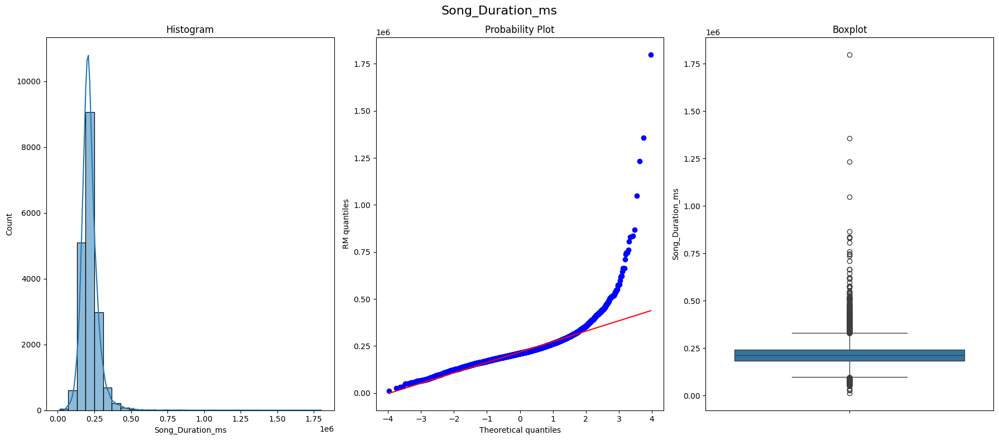

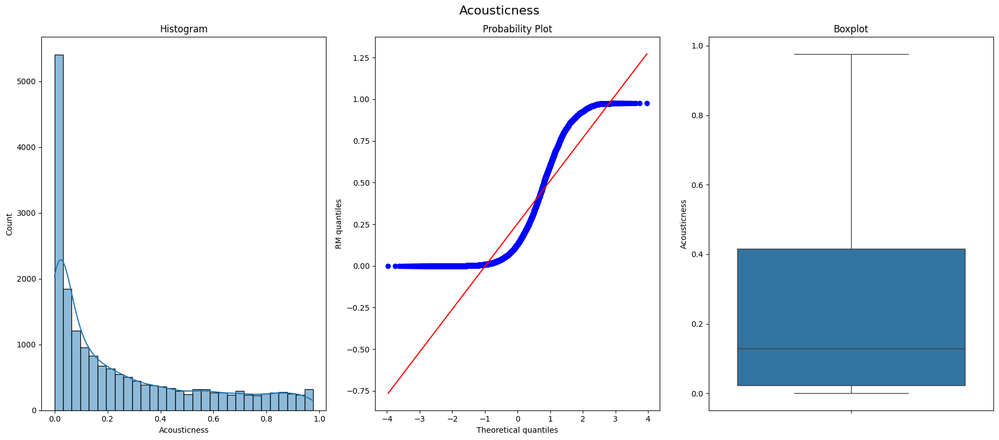

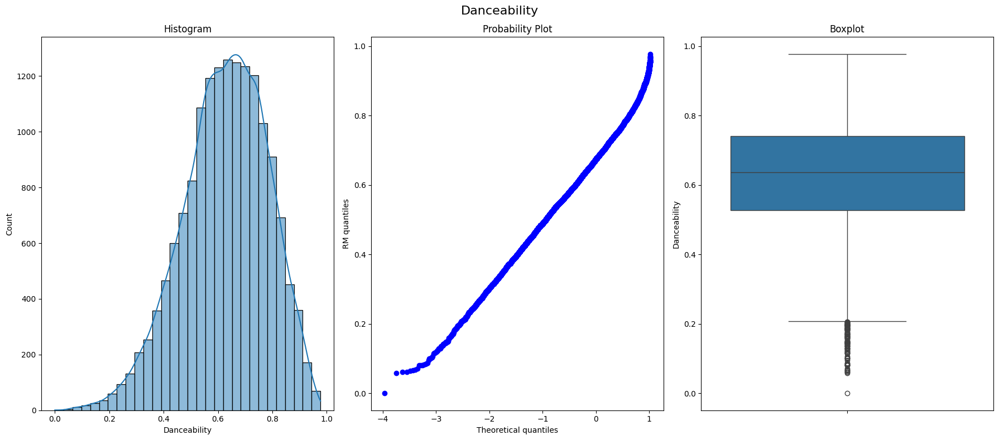

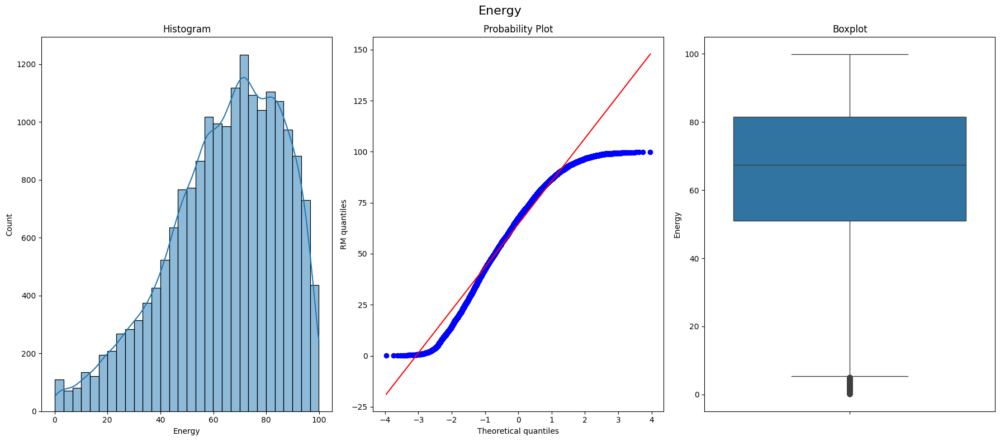

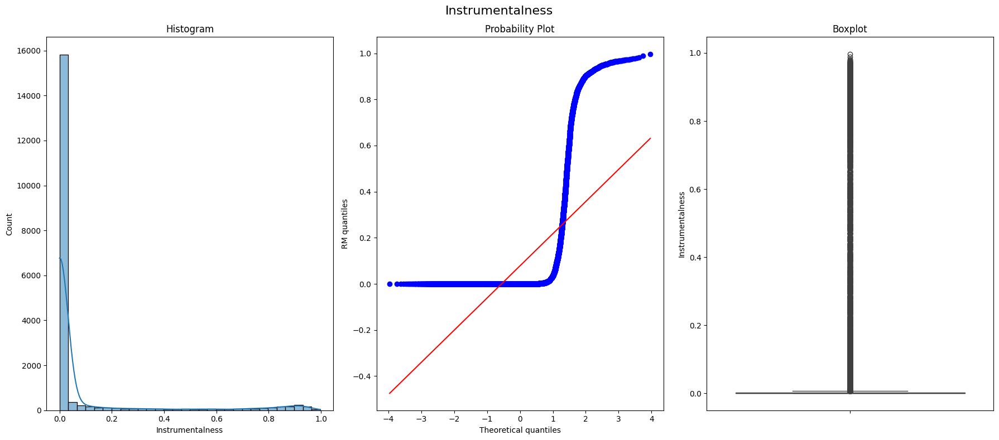

...

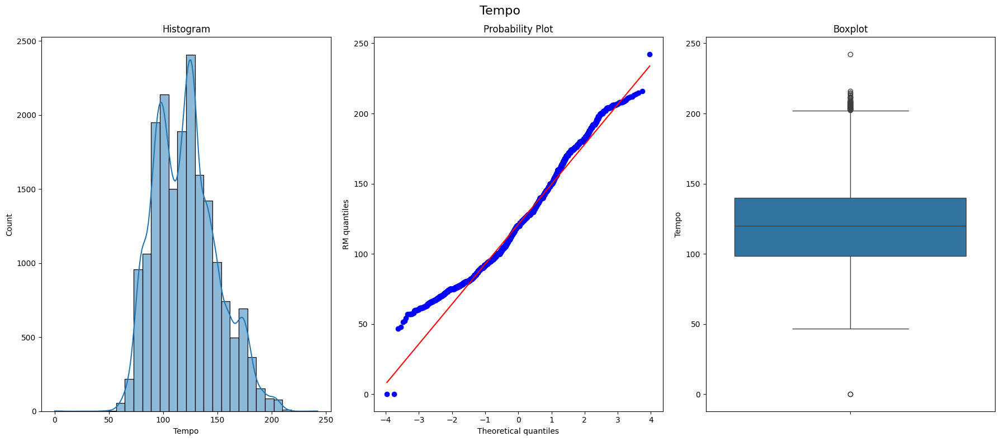

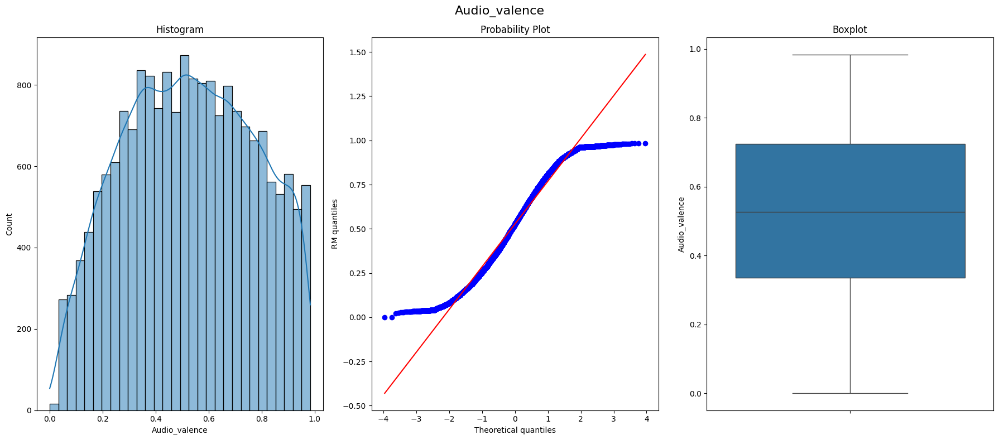

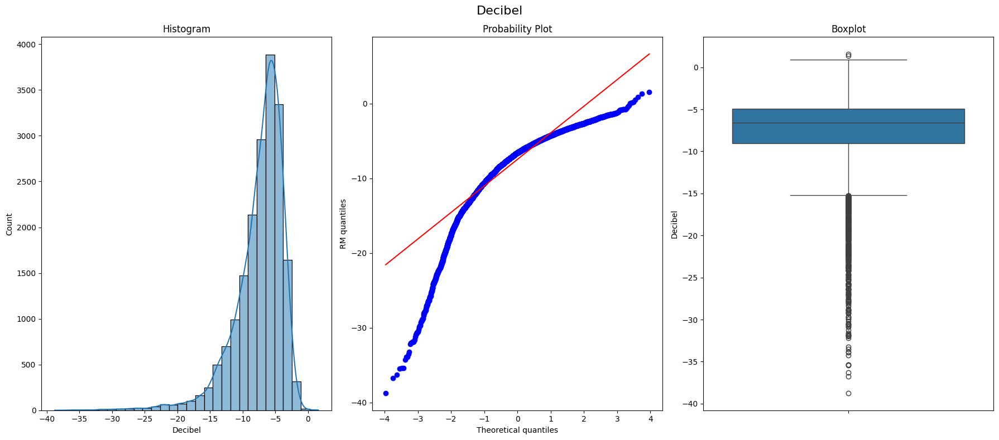

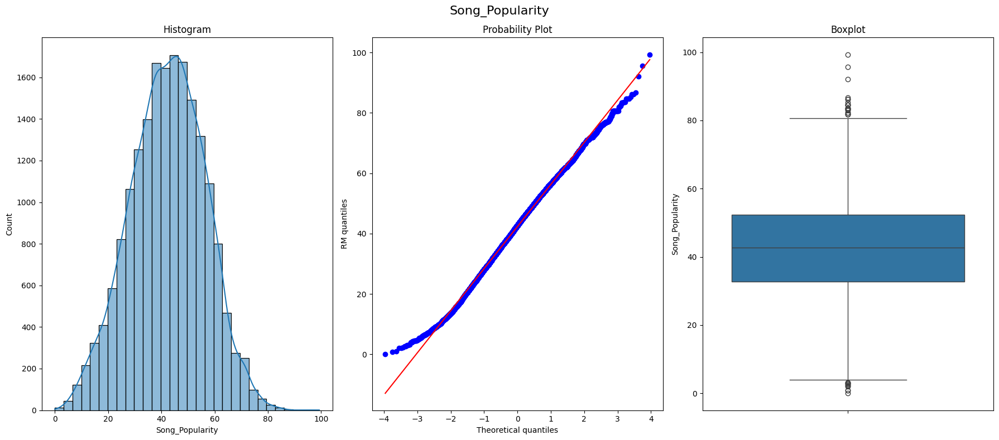

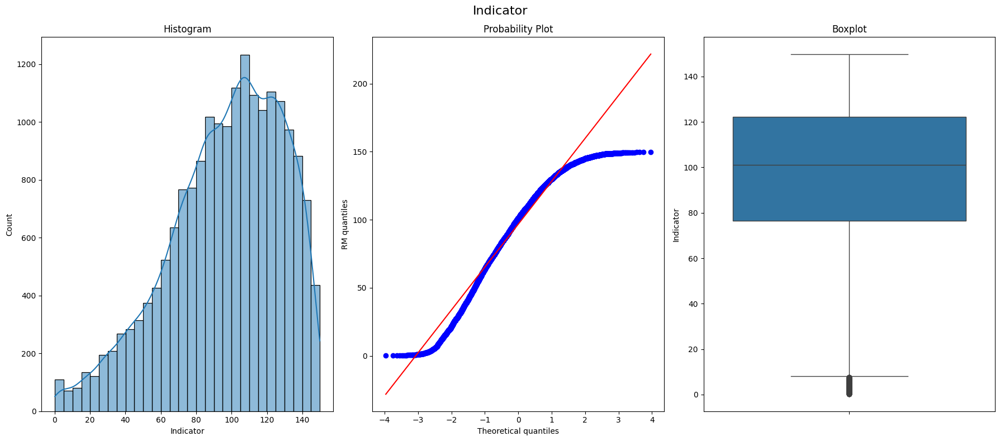

In [12]:
def diagnostic_plots(df, variable):
    plt.figure(figsize=(18, 8))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30, kde=True)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    plt.suptitle(variable,fontsize = 16)
    plt.tight_layout()
    plt.show()

for i in num_cols:
    diagnostic_plots(data, i)


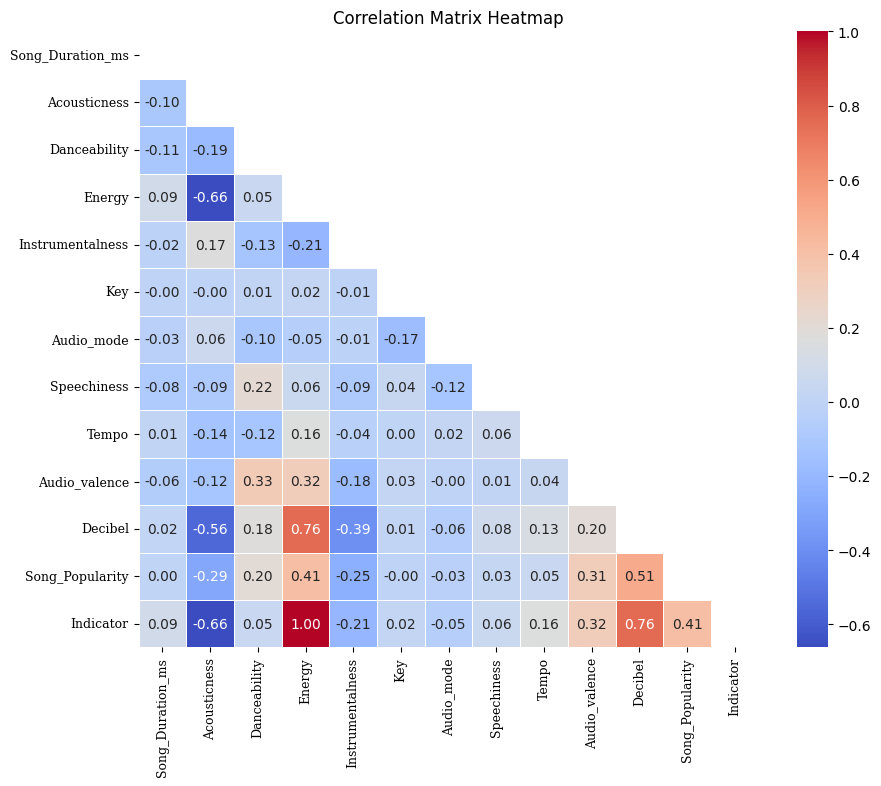

In [13]:
corr = data[num_cols].corr()
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr.corr(), dtype = bool))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, mask = mask, linewidths = 0.5)
plt.title('Correlation Matrix Heatmap')
plt.yticks(fontsize = 9, fontname = 'serif')
plt.xticks(fontsize = 9, fontname = 'serif')
plt.show()

To get better idea of the data, I used various graphs (Histogram, QQ plot, boxplot) to plot all of my numerical values They show:
- The Distribution of data
- How close of a normal distribution the data is
- How skewed is the data

Using those 3 simple graphs, I managed to find a lot of useful insights. I will briefly go through each graph

##### Song_Duration_ms
Looking at the histogram, the data is very skewed to the left. This is because there are a lot of outliers that have long song durations. As such, the histogram looks left skewed due to the extended range. The beginning of the qq plot is normally distributed, shown by the individual value points (blue dots) following the red line, which means they are following a normal distribution. It is only at the end that the song times deviate from the expected normal. The boxplot backs this up, with several anamolous data appearing way above Q3 of the song durations. There also are some songs that are of the opposite nature: having song times lower than Q1 of the song duration. Keeping this in mind, I will have to choose a method to get rid of these outliers to be more normally distributed.

##### Acousticness
On the histogram, there is a huge left skewer, which represents songs that have totally no acoustic instruments. This could encompass many types of genres: EDM, Rock, and Hip-hop. Other than that, the rest of the histogram seems rather normal, showing that the extent of acoustic instruments in songs is very broad. Due to the reasons mentioned before, the left tail of the qq plot is very long. I will attempt to transform this data to make it more normal as it will benefit my linear regression. The boxplot shows me that the mean of the data is rather low, but there is a large range of data, even for the IQR. As such, there are no outliers.

##### Danceability
The distribution of the danceability of songs is normal, with a slight shift to the right, indicating more often than not, a song will be deemed danceable, at least according to the mean of the data, which is reflected in the boxplot, where the mean danceability was above 0.6. There are some null values to take care of however, as the lack of a normal line is a result of the existence of null values. I will have to perform missing value inputation and take care of its outliers. Overall, this is a column that does not need much work.

##### Energy
Songs are more likely to have high energy than low energy, with the mean score being around 0.7. This results in a large skew to the left, albeit with a somewhat normal shape. The qq plot is S-shaped, meaning there is more extreme values than expected. Despite that, the qq plots start off being relatively normal until the drop off in values near the very end of the graph. I will try to get to get this graph more normalised and shift the mean more to the center. I will also have to take care of outliers.

##### Instrumentalness
This graph is extremely left skewed graph, meaning that most songs are not primarly composed of instrumental sounds. There is a very long left tail in the qq plot, before the graph shoots up towards another tail nearing 1 in the instrumentalness sacle, but not as long as the initial tail.

##### Key
The qq plot has gaps in between, which shows that it is of discrete nature. There is a relatively uniform distribution of values, and both the mean, and Interquatile ranges point towards that conclusion too. There is a drop off in frequency for key value 3, but it soon picks back up. I will keep this data in mind for PCA in the future if I want to lower the dimensionality of my dataset.

##### Audio_mode
Audio_mode contains binary values of only 0 and 1. The data dictionary I was provided with did not go in any depth about what it is. There is more rows with Audio_mode being 1 comapred to rows with the Audio_mode value being 0. As a binary value, I will not perform transformation on this data and will keep it in mind for potential PCA.

##### Speechiness
Extremely left skewed graph, with a large amount of outliers, as evidenced with the large amount of circles on the qq plot and boxplot. This graph will require a combination of outlier handling and strong transformations. There are also null values due to lack of normal line.

##### Tempo
Although it has a shaky qq plot, the distribution of values are rather normal, with values closely following the normal line in the qq plot. There are some outliers and 2 extreme values to be cleaned.

##### Audio_valance
The qq plot for this category has 2 tails, showing that there is a higher freqeuncy of extreme values than expected, but without any outliers, as shown in the boxplot. I will try to transform the data to make it more normal later on.

##### Decibel
Extremely right skewed data that is seems to be normally distributed at the right side of the histogram. There are a huge number of outliers below the mean, as shown in the boxplot.

##### Song_Popularity
The values in this category are normally distributed, but is slightly skewed to the left. There are a few outliers that should be removed, judging from the boxplot. This is the target variable that I will be training my data based on. So, I will have to clean the outliers before train test split as I will have to drop it.

##### Indicator
- Won't talk about for reasons explained later


#### Correlation Matrix Heatmap
To identify highly correlated variables, which will negatively affect my linear regression model. I will remove correlation with values of above 0.5 and below -0.5 as an arbituary guideline so as to not remove too many columns but still making an impact.

### Step 3: Data Preprocessing

In [14]:
data.head()

,Code,Song_Name,Song_Duration_ms,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Audio_mode,Speechiness,Tempo,Audio_valence,Dynamism,Decibel,Loudness,Song_Popularity,Indicator
0,HI8,Boulevard of Broken Dreams,262333,0.005410,0.49104,68.2,0.000029,8,112.126921,1,44.10,167.060,0.474,High,-4.095,Blare,57.72,102.30
1,HI10,In The End,216933,0.010094,0.53658,85.3,0.000000,3,122.7664,0,NaN,105.256,0.370,high,-6.407,Roar,45.37,127.95
2,MI11,Seven Nation Army,231733,0.008007,0.72963,46.3,0.447000,0,157.5025,1,118.80,123.881,0.324,Med,-7.828,Roar,47.28,69.45
3,EI8,By The Way,216933,0.025872,0.44649,97.0,0.003550,0,121.4404,1,160.50,122.444,0.198,Extra,-4.938,Blare,52.89,145.50
4,HI9,How You Remind Me,223826,0.000935,0.44253,76.6,0.000000,10,123.8769,1,46.95,172.011,0.574,Hi,-5.065,Blare,46.68,114.90


#### Check for duplicates using Song_Name as primary key

In [15]:
number_of_duplicates = data.duplicated('Song_Name').sum()

print("Number of remaining duplicates in 'Song_Name':", number_of_duplicates)

Number of remaining duplicates in 'Song_Name': 5765


In [16]:
data.count()

Code                18835
Song_Name           18835
Song_Duration_ms    18835
Acousticness        18835
Danceability        15938
Energy              18835
Instrumentalness    18835
Key                 18835
Liveness            18835
Audio_mode          18835
Speechiness         13184
Tempo               18835
Audio_valence       18835
Dynamism            15137
Decibel             18835
Loudness            18835
Song_Popularity     18835
Indicator           18835
dtype: int64

In [17]:
data = data.drop_duplicates(subset='Song_Name', keep='first')
number_of_duplicates = data.duplicated('Song_Name').sum()

print("Number of remaining duplicates in 'Song_Name':", number_of_duplicates)

Number of remaining duplicates in 'Song_Name': 0


No more duplicates

In [18]:
data.count()

Code                13070
Song_Name           13070
Song_Duration_ms    13070
Acousticness        13070
Danceability        11081
Energy              13070
Instrumentalness    13070
Key                 13070
Liveness            13070
Audio_mode          13070
Speechiness          9184
Tempo               13070
Audio_valence       13070
Dynamism            10530
Decibel             13070
Loudness            13070
Song_Popularity     13070
Indicator           13070
dtype: int64

### Cleaning the Categorical Columns first

In [19]:
cat_cols

['Code', 'Song_Name', 'Liveness', 'Dynamism', 'Loudness']

#### Dropping both of these rows as they have no use to the model

In [20]:
cat_cols.remove('Code')
data = data.drop('Code', axis = 1)
cat_cols.remove('Song_Name')
data = data.drop('Song_Name', axis = 1)

In [21]:
data.head()

,Song_Duration_ms,Acousticness,Danceability,Energy,Instrumentalness,Key,Liveness,Audio_mode,Speechiness,Tempo,Audio_valence,Dynamism,Decibel,Loudness,Song_Popularity,Indicator
0,262333,0.005410,0.49104,68.2,0.000029,8,112.126921,1,44.10,167.060,0.474,High,-4.095,Blare,57.72,102.30
1,216933,0.010094,0.53658,85.3,0.000000,3,122.7664,0,NaN,105.256,0.370,high,-6.407,Roar,45.37,127.95
2,231733,0.008007,0.72963,46.3,0.447000,0,157.5025,1,118.80,123.881,0.324,Med,-7.828,Roar,47.28,69.45
3,216933,0.025872,0.44649,97.0,0.003550,0,121.4404,1,160.50,122.444,0.198,Extra,-4.938,Blare,52.89,145.50
4,223826,0.000935,0.44253,76.6,0.000000,10,123.8769,1,46.95,172.011,0.574,Hi,-5.065,Blare,46.68,114.90


##### Finding any irregular data

In [22]:
liveness_unique_values = np.sort(data['Liveness'].unique())
print(liveness_unique_values)

['102.394161' '102.981904' '103.164649' ... '393.6256' '394.4196' '?']


In [23]:
data['Liveness'].str.count('\?').sum()

1

I will drop this row as one row is negligible out of 13070

In [24]:
data = data[data['Liveness'] != '?']

In [25]:
data['Liveness'].str.count('\?').sum()

0

In [26]:
dynamism_unqiue_value = data['Dynamism'].unique()
print(dynamism_unqiue_value)

['High' 'high' 'Med' 'Extra' 'Hi' nan 'h' 'Medium' 'm' 'Low' 'Lo' 'l']


There are many ways of representing the same value;Have to group up

In [27]:
dynamism_map = {"high": "High", "Hi": "High", "h": "High", 
                "Medium": "Med", "m": "Med", 
                "Lo": "Low", "l": "Low", "Extra": "Extra High"} 

data["Dynamism"] = data["Dynamism"].replace(dynamism_map) 
print(data["Dynamism"].unique())

['High' 'Med' 'Extra High' nan 'Low']


In [28]:
data['Dynamism'].isnull().sum()

2540

^ There is too many null values to remove. I will perform value imputation later

In [29]:
loudness_unique_values = np.sort(data['Loudness'].unique())
print(loudness_unique_values)

['?' 'Babble' 'Blare' 'Blast' 'Boom' 'Buzz' 'Chatter' 'Clang' 'Deafening'
 'Drone' 'Ear-splitting' 'Hum' 'Mumble' 'Murmur' 'Mutter' 'Roar' 'Rumble'
 'Rustle' 'Whisper']


In [30]:
data['Loudness'].str.count('\?').sum()

1323

^ There is too many null values to remove. I will perform value imputation later.

In [31]:
for col in cat_cols:
    unique_count = data[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Liveness': 0 nan values
'Dynamism': 2540 nan values
'Loudness': 0 nan values


^ There are too many null values to remove. I will perform value imputation later

### Cleaning the Numerical Columns

I will remove correlation with values of above 0.5 and below -0.5 as an arbituary guideline so as to not remove too many columns but still making an impact.

-----------------------------------------

As seen from the EDA heatmap graph, the 'Energy' and 'Indicator' column have a 1:1 relationship. This means they are representing the same thing. To prevent this column from having too much weight on the output and due to highly correlated inputs being bad for a linear model, I will drop the 'Indicator' column.

I dropped it over the 'Energy' column as 'Energy' is an easier name to understand

In [32]:
num_cols.remove('Indicator')
data = data.drop('Indicator', axis = 1)

Remove Acousticness over Decibel due to High Correlation because I need decibel later on

In [33]:
num_cols.remove('Acousticness')
data = data.drop('Acousticness', axis = 1)

Removing Energy for having High Correlation and same reasoning

In [34]:
num_cols.remove('Energy')
data = data.drop('Energy', axis = 1)

Note: Did not remove Decibel even though it had high correlation with Song Popularity as I am dropping Song Popularity for train test split

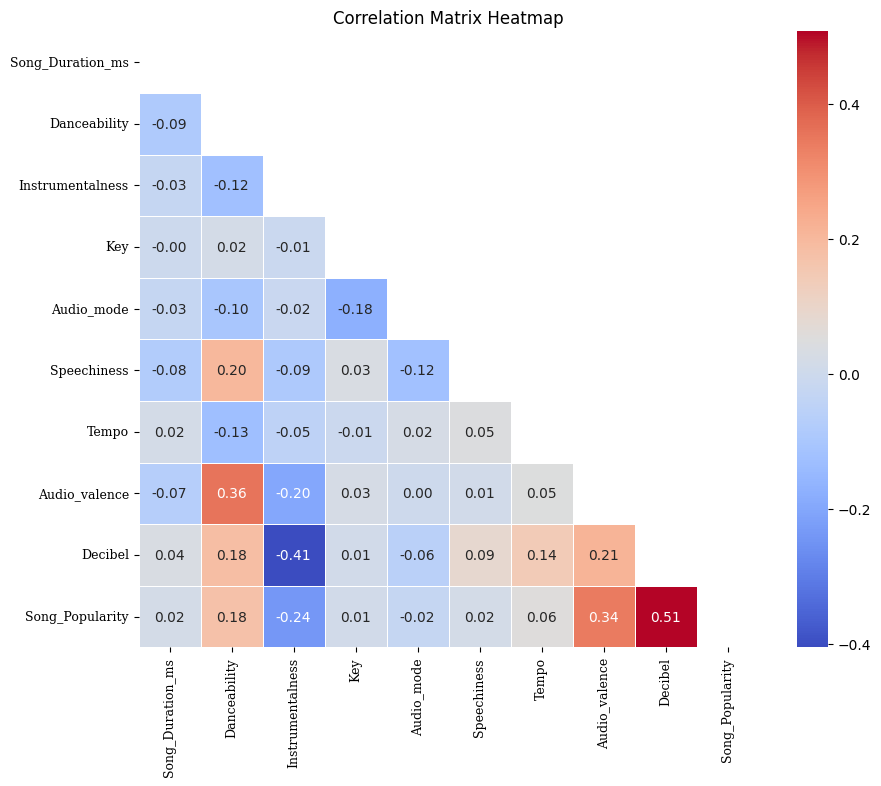

In [35]:
corr = data[num_cols].corr()
plt.figure(figsize=(10, 8))
mask = np.triu(np.ones_like(corr.corr(), dtype = bool))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10}, mask = mask, linewidths = 0.5)
plt.title('Correlation Matrix Heatmap')
plt.yticks(fontsize = 9, fontname = 'serif')
plt.xticks(fontsize = 9, fontname = 'serif')
plt.show()

In [36]:
data[num_cols].info()

<class 'pandas.core.frame.DataFrame'>
Index: 13069 entries, 0 to 18834
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Song_Duration_ms  13069 non-null  int64  
 1   Danceability      11080 non-null  float64
 2   Instrumentalness  13069 non-null  float64
 3   Key               13069 non-null  int64  
 4   Audio_mode        13069 non-null  int64  
 5   Speechiness       9184 non-null   float64
 6   Tempo             13069 non-null  float64
 7   Audio_valence     13069 non-null  float64
 8   Decibel           13069 non-null  float64
 9   Song_Popularity   13069 non-null  float64
dtypes: float64(7), int64(3)
memory usage: 1.1 MB


In [37]:
for col in num_cols:
    max_value = data[col].max()
    min_value = data[col].min()
    mean_value = data[col].mean()
    print(f"'{col}': Max: {max_value}, Min: {min_value}, Mean: {mean_value:.3f}\n")


'Song_Duration_ms': Max: 1799346, Min: 12000, Mean: 218627.765

'Danceability': Max: 0.97713, Min: 0.0, Mean: 0.618

'Instrumentalness': Max: 0.997, Min: 0.0, Mean: 0.097

'Key': Max: 11, Min: 0, Mean: 5.320

'Audio_mode': Max: 1, Min: 0, Mean: 0.633

'Speechiness': Max: 1410.0, Min: 0.0, Mean: 150.303

'Tempo': Max: 242.318, Min: 0.0, Mean: 121.153

'Audio_valence': Max: 0.984, Min: 0.0, Mean: 0.529

'Decibel': Max: 1.585, Min: -38.768, Mean: -7.791

'Song_Popularity': Max: 99.32, Min: 0.0, Mean: 39.704



In [38]:
for col in num_cols:
    unique_count = data[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Song_Duration_ms': 0 nan values
'Danceability': 1989 nan values
'Instrumentalness': 0 nan values
'Key': 0 nan values
'Audio_mode': 0 nan values
'Speechiness': 3885 nan values
'Tempo': 0 nan values
'Audio_valence': 0 nan values
'Decibel': 0 nan values
'Song_Popularity': 0 nan values


In [39]:
for col in cat_cols:
    unique_count = data[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Liveness': 0 nan values
'Dynamism': 2540 nan values
'Loudness': 0 nan values


Trimming Song Popularity before dropping it in train test split

In [40]:
def find_boundaries(df, variable, distance):

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [41]:
song_popularity_upper_limit, song_popularity_lower_limit = find_boundaries(data, 'Song_Popularity', 1.5)
song_popularity_upper_limit, song_popularity_lower_limit

(75.82, 3.66)

In [42]:
song_popularity_outliers = np.where(data['Song_Popularity'] > song_popularity_upper_limit, True,
                       np.where(data['Song_Popularity'] < song_popularity_lower_limit, True, False))

In [43]:
outlier_count = np.sum(song_popularity_outliers)
print("Number of outliers in 'Song_Popularity':", outlier_count)

Number of outliers in 'Song_Popularity': 55


^ Number of outliers small enough to trim

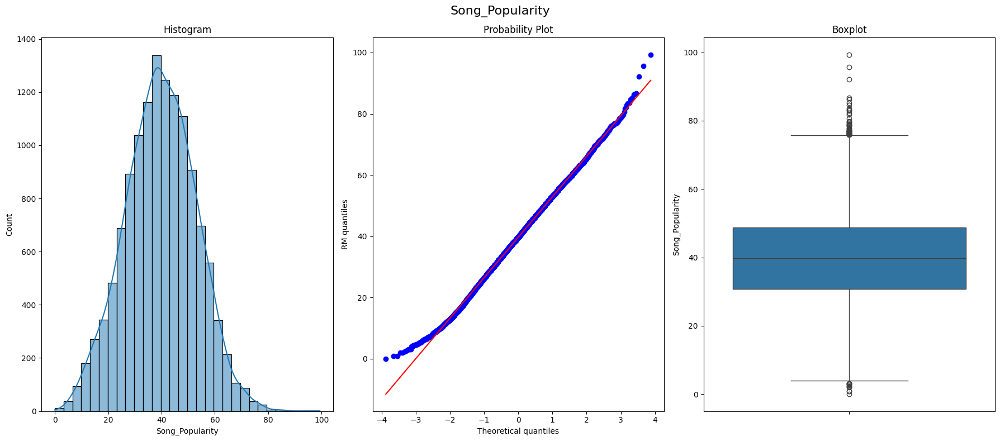

In [44]:
diagnostic_plots(data, 'Song_Popularity')

In [45]:
data_trimmed = data.loc[~song_popularity_outliers]
data.shape, data_trimmed.shape

((13069, 13), (13014, 13))

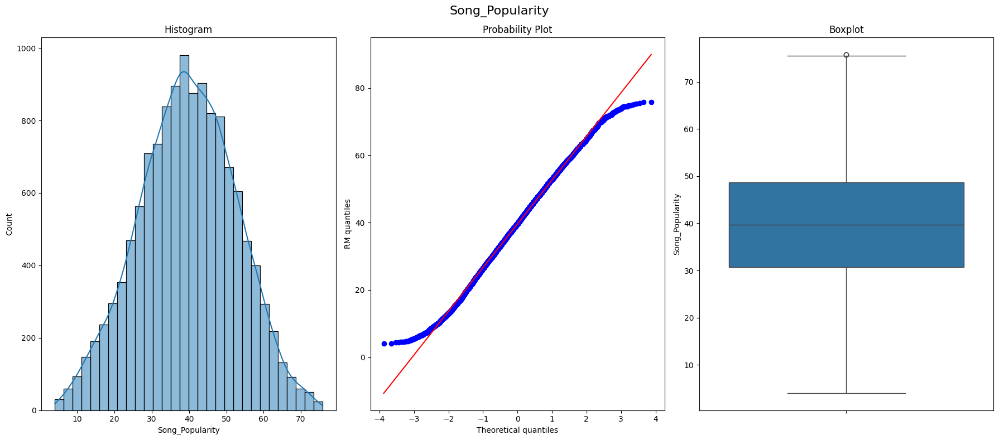

In [46]:
diagnostic_plots(data_trimmed, 'Song_Popularity')

In [47]:
max_value = data_trimmed['Song_Popularity'].max()
min_value = data_trimmed['Song_Popularity'].min()
mean_value = data_trimmed['Song_Popularity'].mean()

print(f"'Song_Popularity': Max: {max_value}, Min: {min_value}, Mean: {mean_value:.3f}\n")


'Song_Popularity': Max: 75.78, Min: 3.99, Mean: 39.600



3a)

I started off the data cleaning process by checking if the data had any duplicates. I used Song_Name as the primary key as each song is supposed to be on here once only and should not have any other duplicates. I assumed code was the primary key for this current dataset and will not have any duplicates.

After removing duplicates, I decided to clean the categorical columns first. I took a look at my Categorical Columns and dropped both "Code" and "Song_Name" as they were just identifiers and will not serve any purpose to my model

Next, I wanted to check for any irregular data that was not supposed to be there. I sorted the values then printed them out because in cases like in Liveness, even when numerical numbers are in string format, they will still be seperated from the words, allowing me to find outliers in the colunmns. Doing this, I found a row with the liveness value of "?". After checking if the amount of rows with "?" in the Liveness column, I found only this one row with such data. As such, I will drop that row as this one row is negligible out of 13070. All off the values there were numbers in string format, most likely due to the irregular format and the existence of the "?" preventing the numbers to be in float format. Aftering removing it, I will convert all of the string values into float so my model can train using it.

Moving on to "Dynamism", I realised that there were many ways of represenating of the same value. As such, I decided to group the values up: "high", "h" and "High" being in the same category.
After using a dictionary and mapping to map the dictionary's value on, there still was nan values. There were 2540 rows of null data, which was too large to remove. As such, I will perform value imputation for this value later on.

Moving on to the next category, I discovered "Loudness" has "?" values too. I checked the number of rows with null value on "Loudness". Since the value is too large to just ignore and remove rows without a value, I have to use value importaion.

Afterwards, I moved on to cleaning numerical columns. To improve my linear regression model, I dropped categories with a correlation score of 0.5 and above or -0.5 and below as an arbituary guideline so I won't have to delete so mamy columm but at the same time, still being able to reduce multicolinarity inputs.

Firstly, from the heatmap, I can tell that the correlation between "Indicator" and "Energy" column was 1; they represented the exact same thing. As such, I should drop one so the same value won't pop up twice in the each row and have an exagerated influence over the result. I decided to drop "Indicator" as "Energy" was a more straightfoward description that I can quickly understand.

After dropping it, I still had 4 more value pairs that had really high correlation: (Decibel and Acousticness), (Energy and Decibel), (Acousticness and Energy), (Song_Popularity and Decibel).

Firstly, I had to decide if I wanted to keep Decibel or Acousticness. Since I had to use decibel to input null values for the categorical values later on, I dropped acousticness. For a similar reason, I dropped Energy. Lastly, I did not drop decibel as I needed the column and I am going to drop the "Song_Popularity" column soon afterwards for train test split.





I decided to clean outliers in "Song_Popularity", my target variable before dropping it in train test split to avoid my data target being trained on anomalous data, and because I will not be able to access it later. I detected 55 anamolous data and decided to trim then as the number of rows was not so big and to preserve my current distribution.

### Step 4: Train and Test Split

In [48]:
X_train, X_test, y_train, y_test = train_test_split(
    data_trimmed.drop('Song_Popularity', axis=1), data_trimmed['Song_Popularity'], test_size=0.3, random_state=69)

X_train.shape, X_test.shape

((9109, 12), (3905, 12))

In [49]:
num_cols_x_train = [c for c in X_train.columns if X_train[c].dtypes != 'object']

In [50]:
for col in num_cols_x_train:
    unique_count = X_train[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Song_Duration_ms': 0 nan values
'Danceability': 1390 nan values
'Instrumentalness': 0 nan values
'Key': 0 nan values
'Audio_mode': 0 nan values
'Speechiness': 2697 nan values
'Tempo': 0 nan values
'Audio_valence': 0 nan values
'Decibel': 0 nan values


In [51]:
for col in num_cols_x_train:
    unique_count = X_test[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Song_Duration_ms': 0 nan values
'Danceability': 592 nan values
'Instrumentalness': 0 nan values
'Key': 0 nan values
'Audio_mode': 0 nan values
'Speechiness': 1174 nan values
'Tempo': 0 nan values
'Audio_valence': 0 nan values
'Decibel': 0 nan values


In [52]:
X_train.count()

Song_Duration_ms    9109
Danceability        7719
Instrumentalness    9109
Key                 9109
Liveness            9109
Audio_mode          9109
Speechiness         6412
Tempo               9109
Audio_valence       9109
Dynamism            7346
Decibel             9109
Loudness            9109
dtype: int64

In [53]:
X_test.count()

Song_Duration_ms    3905
Danceability        3313
Instrumentalness    3905
Key                 3905
Liveness            3905
Audio_mode          3905
Speechiness         2731
Tempo               3905
Audio_valence       3905
Dynamism            3139
Decibel             3905
Loudness            3905
dtype: int64

In [54]:
for col in num_cols_x_train:
    unique_count = X_train[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Song_Duration_ms': 0 nan values
'Danceability': 1390 nan values
'Instrumentalness': 0 nan values
'Key': 0 nan values
'Audio_mode': 0 nan values
'Speechiness': 2697 nan values
'Tempo': 0 nan values
'Audio_valence': 0 nan values
'Decibel': 0 nan values


In [55]:
for col in num_cols_x_train:
    unique_count = X_test[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Song_Duration_ms': 0 nan values
'Danceability': 592 nan values
'Instrumentalness': 0 nan values
'Key': 0 nan values
'Audio_mode': 0 nan values
'Speechiness': 1174 nan values
'Tempo': 0 nan values
'Audio_valence': 0 nan values
'Decibel': 0 nan values


### Step 5: Missing Value Imputation

In [56]:
X_train.isnull().sum()

Song_Duration_ms       0
Danceability        1390
Instrumentalness       0
Key                    0
Liveness               0
Audio_mode             0
Speechiness         2697
Tempo                  0
Audio_valence          0
Dynamism            1763
Decibel                0
Loudness               0
dtype: int64

In [57]:
X_test.isnull().sum()

Song_Duration_ms       0
Danceability         592
Instrumentalness       0
Key                    0
Liveness               0
Audio_mode             0
Speechiness         1174
Tempo                  0
Audio_valence          0
Dynamism             766
Decibel                0
Loudness               0
dtype: int64

### Now clean cat_cols

Loudness just refers to how loud a song is and dynamism is how loudly a song should be played

As such, I will try to find the decibel range of each data for the nan and "?" values

In [58]:
clean_loudness = data_trimmed[data_trimmed['Loudness'] != '?']

In [59]:
loudness_cat_max = clean_loudness.groupby('Loudness')['Decibel'].max().sort_values()
print(loudness_cat_max)

Loudness
Murmur      -38.768
Whisper     -35.389
Mumble      -31.238
Mutter      -28.078
Hum         -25.055
Rustle      -22.008
Drone       -20.046
Buzz        -18.014
Chatter     -16.009
Babble      -12.004
Rumble      -10.001
Clang        -8.004
Roar         -6.002
Blare        -4.001
Boom         -2.005
Blast        -0.398
Deafening     0.198
Name: Decibel, dtype: float64


Replacing the "?" data with nan so I can use built-in functions for replacing null values all at once.

In [60]:
X_train['Loudness'] = X_train['Loudness'].replace('?', np.nan)
X_test['Loudness'] = X_test['Loudness'].replace('?', np.nan)

In [61]:
loudness_cat_max_dict = {
    'Murmur': -38.768, 'Whisper': -35.389, 'Mumble': -31.238, 'Mutter': -28.078, 
    'Hum': -25.055, 'Rustle': -22.008, 'Drone': -20.046, 'Buzz': -18.014, 
    'Chatter': -16.009, 'Babble': -12.004, 'Rumble': -10.001, 'Clang': -8.004, 
    'Roar': -6.002, 'Blare': -4.001, 'Boom': -2.005, 'Blast': -0.257, 
    'Deafening': 0.878, 'Ear-splitting': 1.585
}

In [62]:
def find_nearest_category_loudness(decibel):
    closest_category = min(loudness_cat_max_dict, key=lambda x: abs(loudness_cat_max_dict[x] - decibel))
    return closest_category

Used a function to fill in Nan values based on my estimation of the range of decibels that make up each value of Loudness

In [63]:
X_train.loc[X_train['Loudness'].isna(), 'Loudness'] = X_train['Decibel'].apply(find_nearest_category_loudness)
X_test.loc[X_test['Loudness'].isna(), 'Loudness'] = X_test['Decibel'].apply(find_nearest_category_loudness)

print(X_train['Loudness'].unique())

['Clang' 'Blare' 'Roar' 'Rumble' 'Boom' 'Babble' 'Rustle' 'Chatter'
 'Blast' 'Mutter' 'Mumble' 'Whisper' 'Hum' 'Buzz' 'Drone' 'Deafening'
 'Murmur']


In [64]:
loudness_counts = X_train['Loudness'].value_counts()

print(loudness_counts)

Loudness
Blare        2456
Roar         2160
Clang        1455
Rumble        900
Boom          892
Babble        795
Chatter       127
Buzz           75
Blast          70
Rustle         60
Drone          58
Hum            25
Mutter         22
Mumble         10
Whisper         2
Deafening       1
Murmur          1
Name: count, dtype: int64


Get decibel range of for each dynmaism value

In [65]:
clean_dynamism = data[data['Dynamism'].notna()]

In [66]:
dynamism_cat_max = clean_dynamism.groupby('Dynamism')['Decibel'].max().sort_values()
print(dynamism_cat_max)

Dynamism
Low          -6.873
Med          -1.477
High         -0.257
Extra High    1.585
Name: Decibel, dtype: float64


In [67]:
dynamism_cat_max_dict = {
    'Low': -6.873,
    'Med': -1.477,
    'High': -0.257,
    'Extra High': 1.585
}

In [68]:
def find_nearest_category_dynamism(decibel):
    closest_category = min(dynamism_cat_max_dict, key=lambda x: abs(dynamism_cat_max_dict[x] - decibel))
    return closest_category

Used a function to fill in Nan values based on my estimation of the range of decibels that make up each value of Dynamism

In [69]:
X_train.loc[X_train['Dynamism'].isna(), 'Dynamism'] = X_train['Decibel'].apply(find_nearest_category_dynamism)
X_test.loc[X_test['Dynamism'].isna(), 'Dynamism'] = X_test['Decibel'].apply(find_nearest_category_dynamism)

print(X_train['Dynamism'].unique())

['Med' 'High' 'Low' 'Extra High']


In [70]:
cat_cols_x_train = [c for c in X_train.columns if X_train[c].dtypes=='O']
cat_cols_x_train

['Liveness', 'Dynamism', 'Loudness']

Check for strings and numerical data type

In [71]:
for i in cat_cols_x_train:
    unique_values = X_train[i].unique()

    nums = [x for x in unique_values if isinstance(x, float)]
    strs = [x for x in unique_values if isinstance(x, str)]
    nums.sort()
    strs.sort()

    print('Numbers:', nums)
    print('Strings:', strs)

Numbers: []
Strings: ['102.981904', '103.164649', '103.754596', '104.162436', '104.427961', '104.489284', '104.550625', '104.714289', '104.816644', '104.919049', '104.960025', '104.980516', '105.001009', '105.2676', '105.329169', '105.349696', '105.4729', '105.575625', '105.740089', '105.781225', '105.863521', '105.987025', '106.110601', '106.131204', '106.193025', '106.254864', '106.316721', '106.357969', '106.461124', '106.481761', '106.564329', '106.584976', '106.646929', '106.688241', '106.770889', '106.791556', '106.874244', '106.894921', '106.956964', '106.977649', '107.060409', '107.081104', '107.101801', '107.1225', '107.143201', '107.163904', '107.205316', '107.246736', '107.267449', '107.3296', '107.391769', '107.412496', '107.433225', '107.453956', '107.474689', '107.495424', '107.578384', '107.599129', '107.619876', '107.640625', '107.661376', '107.682129', '107.702884', '107.723641', '107.765161', '107.827456', '107.848225', '107.889769', '107.9521', '107.972881', '107.993

In [72]:
print("Number of rows in x_train:", len(X_train))
print("Number of rows in x_test:", len(X_test))

Number of rows in x_train: 9109
Number of rows in x_test: 3905


In [73]:
for col in cat_cols_x_train:
    unique_count = X_train[col].isna().sum()
    print(f"'{col}': {unique_count} nan values")

'Liveness': 0 nan values
'Dynamism': 0 nan values
'Loudness': 0 nan values


In [74]:
print(np.sort(X_train['Liveness'].unique()))

['102.981904' '103.164649' '103.754596' ... '392.4361' '393.6256'
 '394.4196']


^ Still in string format

In [75]:
X_train['Liveness'] = pd.to_numeric(X_train['Liveness'])
X_test['Liveness'] = pd.to_numeric(X_test['Liveness'])

In [76]:
cat_cols_x_train_2 = [c for c in X_train.columns if X_train[c].dtypes=='O']

print(cat_cols_x_train_2)

['Dynamism', 'Loudness']


In [77]:
np.sort(X_train['Liveness'].unique())

array([102.981904, 103.164649, 103.754596, ..., 392.4361  , 393.6256  ,
       394.4196  ])

In [78]:
num_cols_x_train_2 = [c for c in X_test.columns if X_test[c].dtypes != 'object']

Perform Mean and Median Imputation for missing values

In [79]:
X_train.isnull().sum()

Song_Duration_ms       0
Danceability        1390
Instrumentalness       0
Key                    0
Liveness               0
Audio_mode             0
Speechiness         2697
Tempo                  0
Audio_valence          0
Dynamism               0
Decibel                0
Loudness               0
dtype: int64

In [80]:
X_test.isnull().sum()

Song_Duration_ms       0
Danceability         592
Instrumentalness       0
Key                    0
Liveness               0
Audio_mode             0
Speechiness         1174
Tempo                  0
Audio_valence          0
Dynamism               0
Decibel                0
Loudness               0
dtype: int64

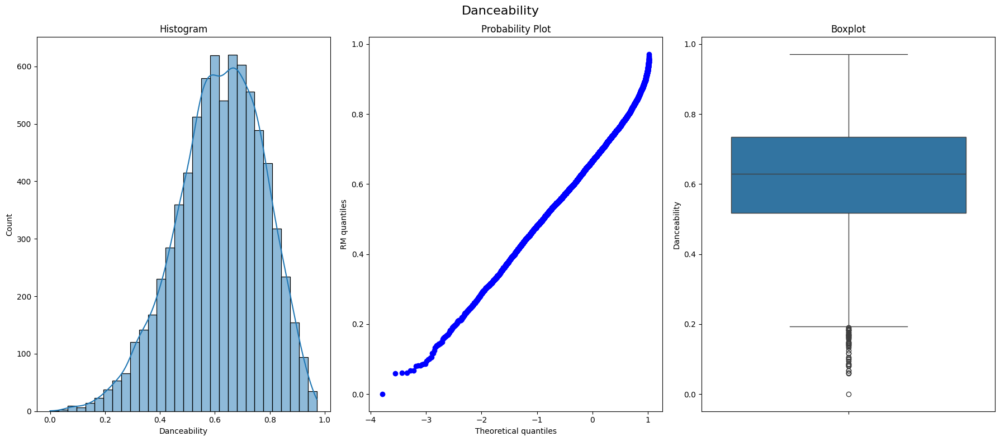

In [81]:
diagnostic_plots(X_train, 'Danceability')

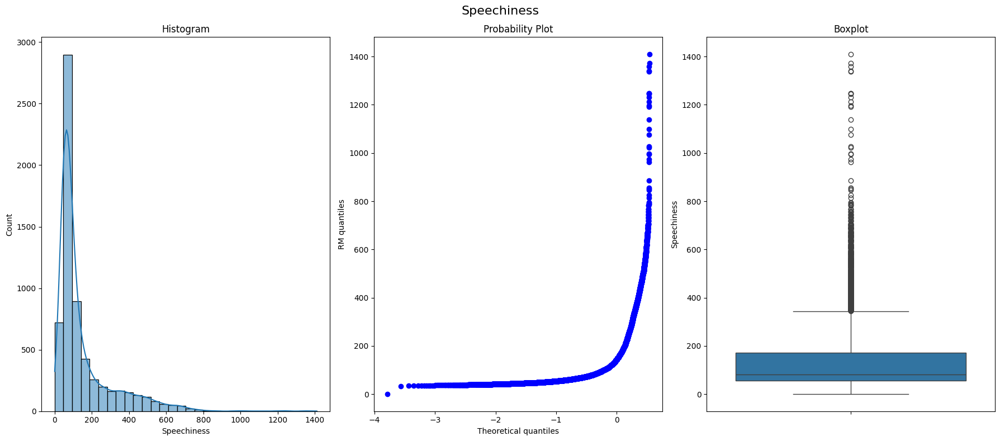

In [82]:
diagnostic_plots(X_train, 'Speechiness')

Imputation Method chosen based on the distribution:
- Normal dist. choose Mean
- Skewed dist. w/ outliers choose Median

In [83]:
median_imputer = MeanMedianImputer(imputation_method='mean',
                                   variables=['Danceability'])

mean_imputer = MeanMedianImputer(imputation_method='median',
                                 variables=['Speechiness'])

median_imputer.fit(X_train)
mean_imputer.fit(X_train)

MeanMedianImputer(variables=['Speechiness'])

In [84]:
median_imputer.imputer_dict_

{'Danceability': 0.618310919160513}

In [85]:
mean_imputer.imputer_dict_


{'Speechiness': 81.525}

In [86]:
X_train = median_imputer.transform(X_train)
X_train = mean_imputer.transform(X_train)
X_test = median_imputer.transform(X_test)
X_test = mean_imputer.transform(X_test)

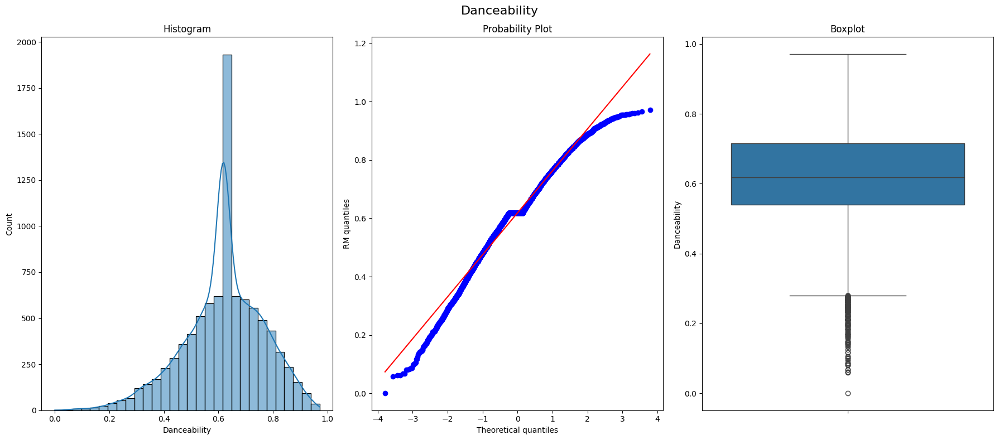

In [87]:
diagnostic_plots(X_train, 'Danceability')

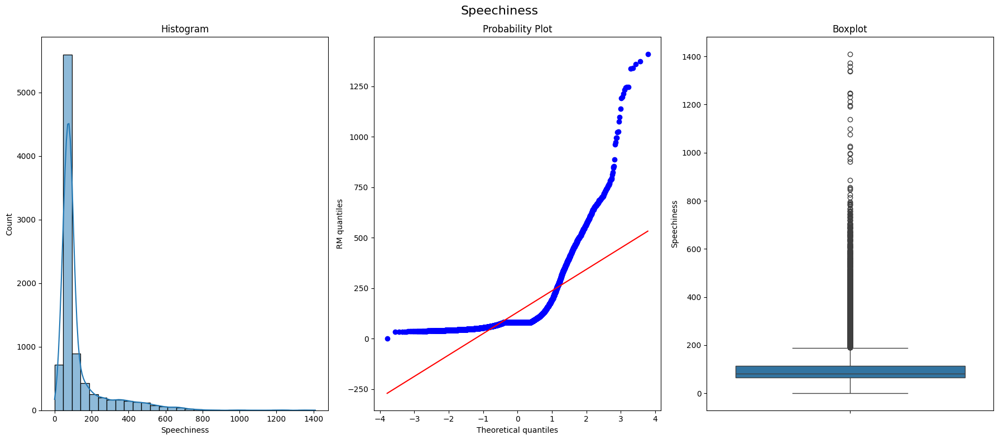

In [88]:
diagnostic_plots(X_train, 'Speechiness')

In [89]:
X_train.isnull().sum()

Song_Duration_ms    0
Danceability        0
Instrumentalness    0
Key                 0
Liveness            0
Audio_mode          0
Speechiness         0
Tempo               0
Audio_valence       0
Dynamism            0
Decibel             0
Loudness            0
dtype: int64

In [90]:
X_test.isnull().sum()

Song_Duration_ms    0
Danceability        0
Instrumentalness    0
Key                 0
Liveness            0
Audio_mode          0
Speechiness         0
Tempo               0
Audio_valence       0
Dynamism            0
Decibel             0
Loudness            0
dtype: int64

In [91]:
for column in X_train.columns:
    if pd.api.types.is_numeric_dtype(X_train[column]):
        lower_bound, upper_bound = find_boundaries(X_train, column, 1.5)
        X_train[column] = X_train[column].clip(lower=lower_bound, upper=upper_bound)
        print(f"{column}: Lower Bound = {lower_bound}, Upper Bound = {upper_bound}")


for column in X_test.columns:
    if pd.api.types.is_numeric_dtype(X_test[column]):
        lower_bound, upper_bound = find_boundaries(X_test, column, 1.5)
        X_test[column] = X_test[column].clip(lower=lower_bound, upper=upper_bound)
        print(f"{column}: Lower Bound = {lower_bound}, Upper Bound = {upper_bound}")

Song_Duration_ms: Lower Bound = 338255.5, Upper Bound = 89075.5
Danceability: Lower Bound = 0.9761399999999999, Upper Bound = 0.2791800000000001
Instrumentalness: Lower Bound = 0.013525, Upper Bound = -0.008115
Key: Lower Bound = 17.0, Upper Bound = -7.0
Liveness: Lower Bound = 195.215466, Upper Bound = 74.15449000000001
Audio_mode: Lower Bound = 2.5, Upper Bound = -1.5
Speechiness: Lower Bound = 189.075, Upper Bound = -9.524999999999991
Tempo: Lower Bound = 202.56699999999998, Upper Bound = 35.67100000000002
Audio_valence: Lower Bound = 1.333, Upper Bound = -0.26699999999999996
Decibel: Lower Bound = 1.6054999999999984, Upper Bound = -16.246499999999997
Song_Duration_ms: Lower Bound = 333372.5, Upper Bound = 94440.5
Danceability: Lower Bound = 0.96228, Upper Bound = 0.28907999999999995
Instrumentalness: Lower Bound = 0.01705, Upper Bound = -0.01023
Key: Lower Bound = 17.0, Upper Bound = -7.0
Liveness: Lower Bound = 193.48010850000003, Upper Bound = 75.0907525
Audio_mode: Lower Bound =

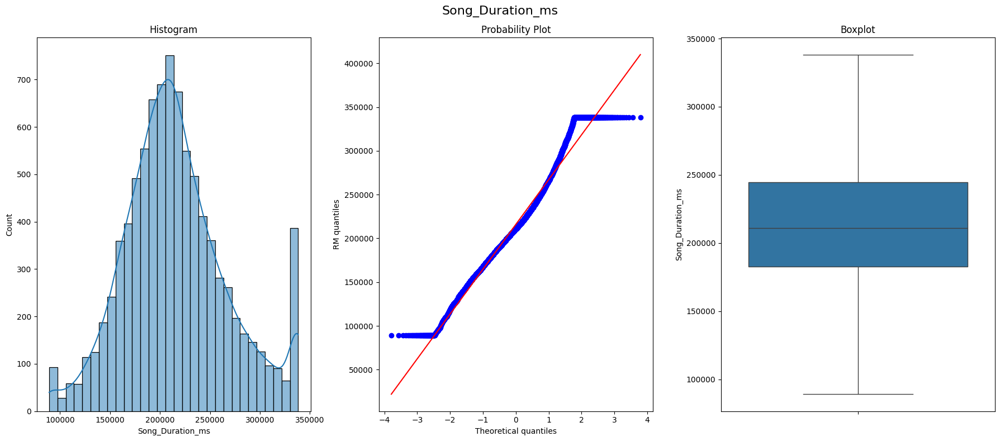

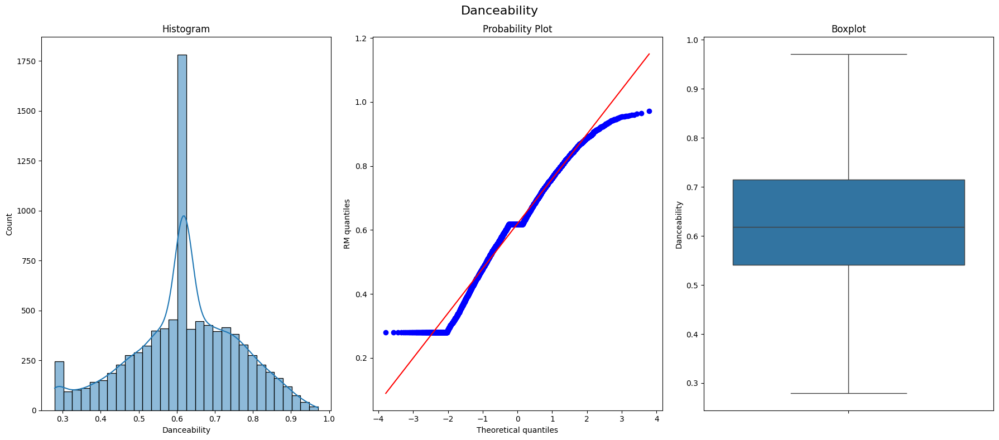

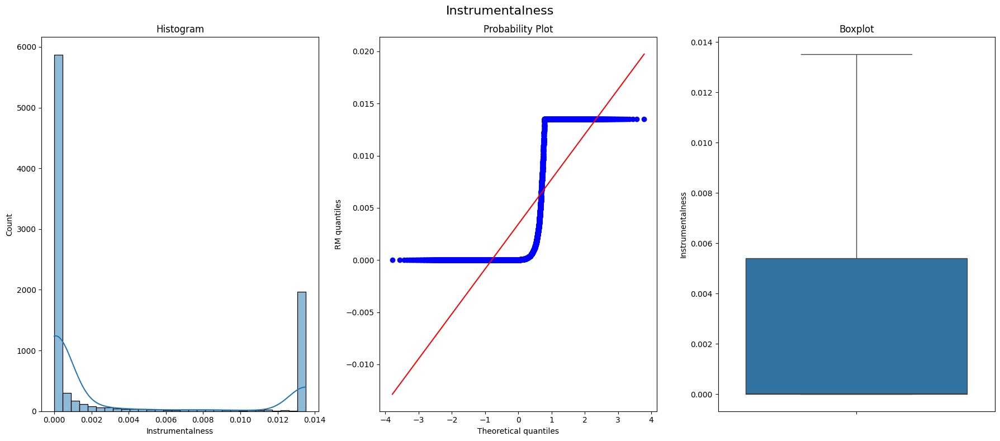

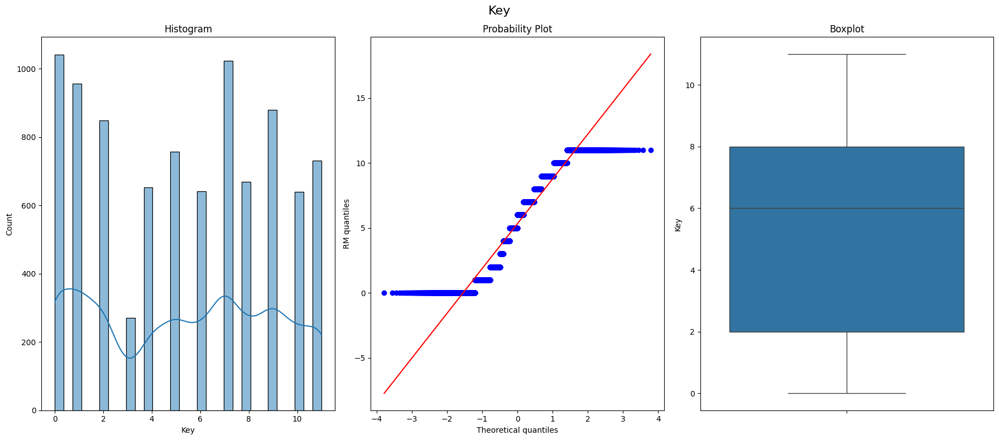

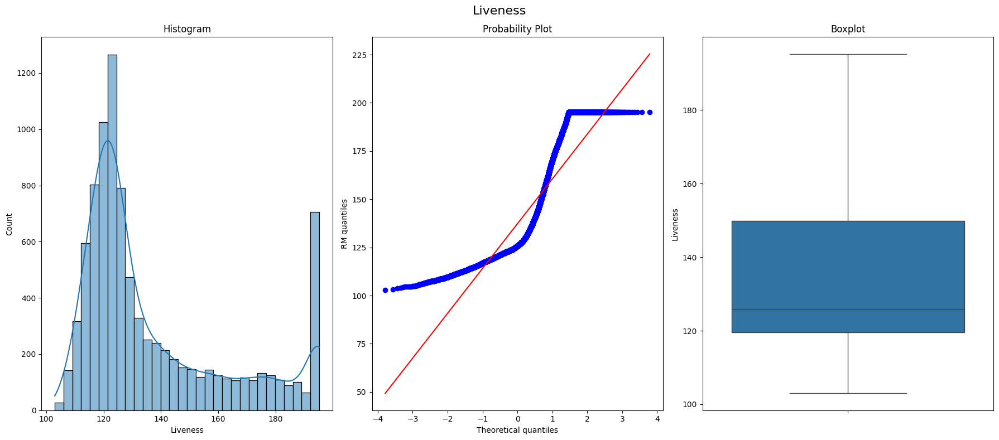

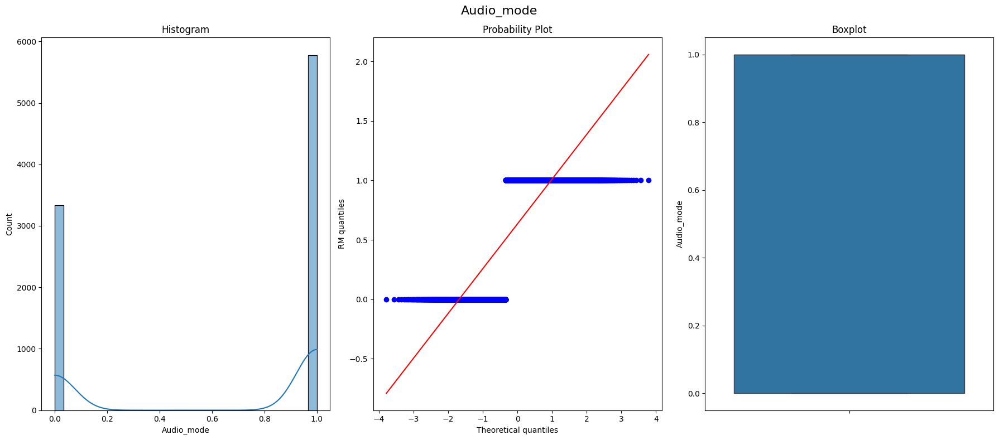

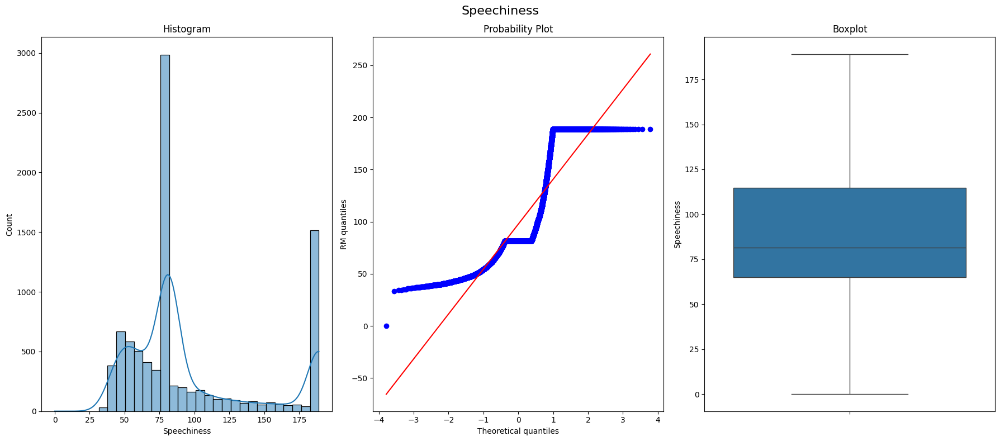

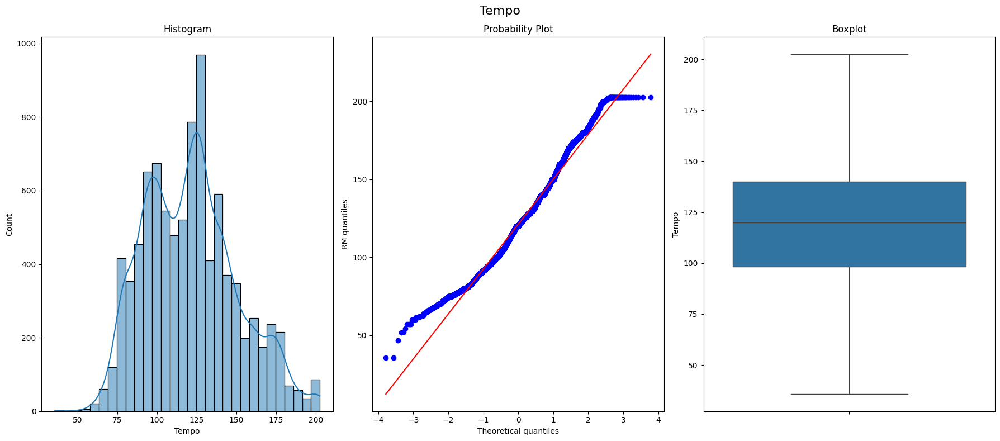

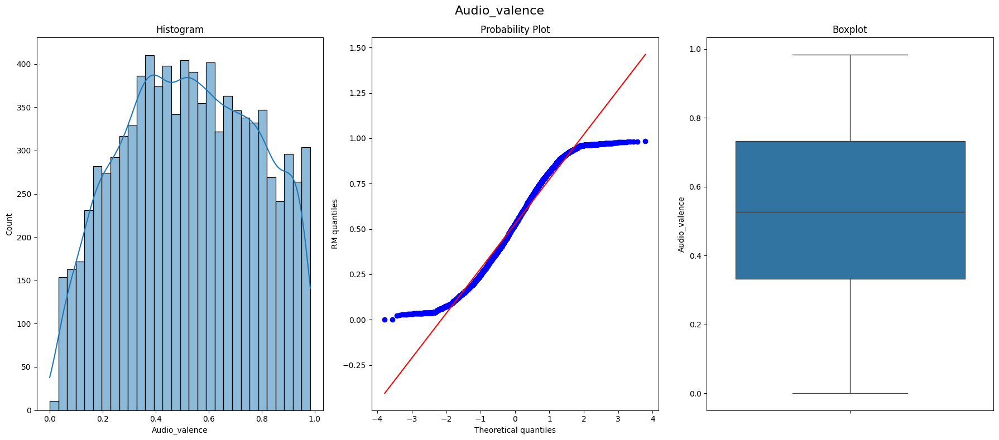

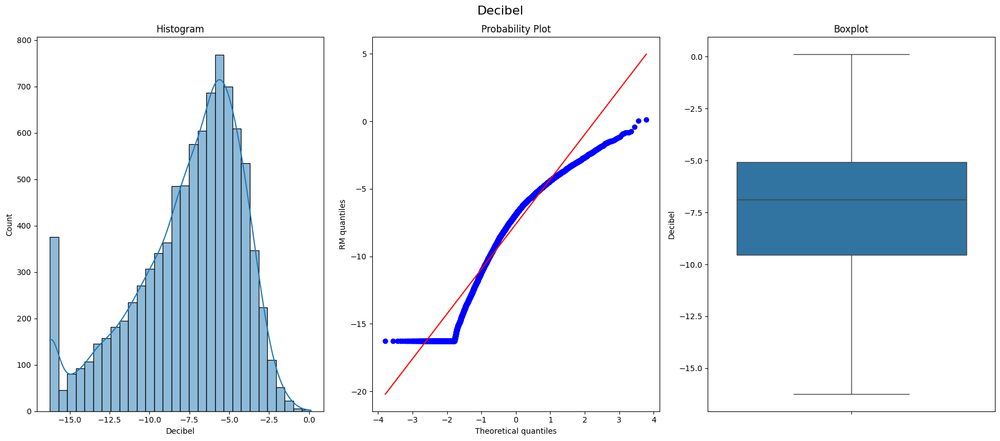

In [92]:
for i in num_cols_x_train_2:
    diagnostic_plots(X_train, i)

In [93]:
print("Number of rows in x_train:", len(X_train))
print("Number of rows in x_test:", len(X_test))

Number of rows in x_train: 9109
Number of rows in x_test: 3905


3b)

I begin by cleaning my categorical columns first, starting with the "Loudness" column. Loudness just refers to how loud a song is while Dynamism is how loudly a song should be played. As such, I will use the unit of sound: "Decibel" to what the Loudness and Dynamism should be classified as based on the decibel of the song. First, I got the clean version of the dataset without the incorrect data. I then print the existing values and create a dictionary for later mapping. Assuming that "Decibel" directly influences the "Loudness" category, I use the groupby function to associate each "Loudness" description with the highest decibel observed. Next, I replace any "?" values in the "Loudness" column with NaN for easier processing later on. I used a function that replaces the missing data with the loudness category closest to its current decibel level. I performed the same method with the "Dynamism" column to fill up its null values. Afterwards, I changed the data type of Liveness value from string to float. 

Moving on to the numerical columns, I used mean imputation for "Danceability" because it has a normal distribution. I used median imputation for the "Speechiness" column because it has a skewed distribution with outliers.

After this 2 steps, I have no more null values in my data.

Finally, I decided to cap away all outliers of every column to prevent them from messing with the model. I decided to cap the data to preserve all my rows.

### Step 6: Categorical Data Encoding

I will perform data encoding for the categorical data. In order to reduce the dimensionality and not have too many new columns, I decide to group all values that make up less than 5% of the overall data as "Other"

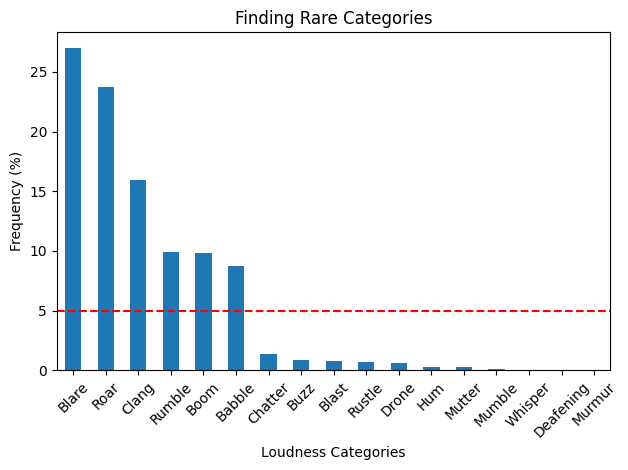

In [94]:
loudness_columns = X_train['Loudness'].unique()
loudness_counts = X_train['Loudness'].value_counts()
sorted_loudness_counts = loudness_counts.sort_values(ascending=False)
total_rows = len(X_train)


loudness_frequencies = sorted_loudness_counts / total_rows * 100
loudness_frequencies_sorted = loudness_frequencies.sort_values(ascending=False)


fig, ax = plt.subplots()
loudness_frequencies_sorted.plot(kind='bar', ax=ax)
ax.axhline(y=5, color='red', linestyle='--')

ax.set_ylabel('Frequency (%)')
ax.set_xlabel('Loudness Categories')
ax.set_title('Finding Rare Categories')
plt.xticks(rotation=45)
plt.tight_layout()

In [95]:
loudness_counts = X_train['Loudness'].value_counts()
total_rows = len(X_train)

threshold = 0.05 * total_rows
rare_categories = loudness_counts[loudness_counts < threshold].index
X_train['Loudness'] = X_train['Loudness'].apply(lambda x: 'Other' if x in rare_categories else x)

print(X_train['Loudness'].unique())

['Clang' 'Blare' 'Roar' 'Rumble' 'Boom' 'Babble' 'Other']


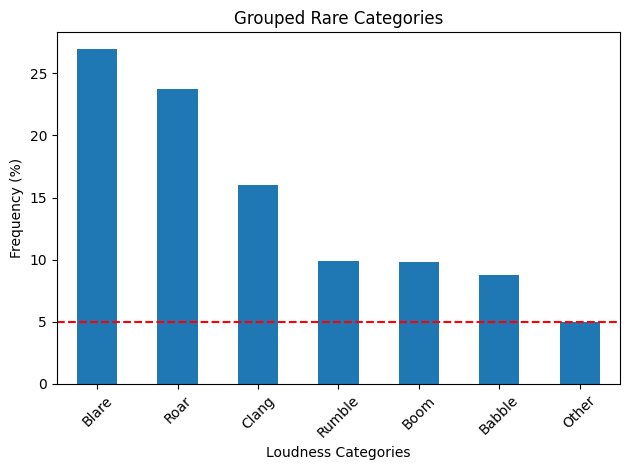

In [96]:
loudness_columns = X_train['Loudness'].unique()
loudness_counts = X_train['Loudness'].value_counts()
sorted_loudness_counts = loudness_counts.sort_values(ascending=False)
total_rows = len(X_train)


loudness_frequencies = sorted_loudness_counts / total_rows * 100
loudness_frequencies_sorted = loudness_frequencies.sort_values(ascending=False)


fig, ax = plt.subplots()
loudness_frequencies_sorted.plot(kind='bar', ax=ax)
ax.axhline(y=5, color='red', linestyle='--')

ax.set_ylabel('Frequency (%)')
ax.set_xlabel('Loudness Categories')
ax.set_title('Grouped Rare Categories')
plt.xticks(rotation=45)
plt.tight_layout()

In [97]:
loudness_columns_pre = X_train['Loudness'].unique()
loudness_counts_pre = X_train['Loudness'].value_counts()
sorted_loudness_counts_pre = loudness_counts_pre.sort_values(ascending=False)
print(sorted_loudness_counts_pre)


Loudness
Blare     2456
Roar      2160
Clang     1455
Rumble     900
Boom       892
Babble     795
Other      451
Name: count, dtype: int64


In [98]:
dynamism_columns_pre = X_train['Dynamism'].unique()
dynamism_columns_pre = X_train['Dynamism'].value_counts()
sorted_dynamism_counts_pre = dynamism_columns_pre.sort_values(ascending=False)
print(sorted_dynamism_counts_pre)


Dynamism
High          3574
Med           2861
Low           1863
Extra High     811
Name: count, dtype: int64


Using One Hot Encoder to encode both variables

In [99]:
# let's create the encoder
ohe_enc = OneHotEncoder(
    top_categories=None,
    drop_last=True)  # to return k-1, false to return k

In [100]:
# fit the encoder to the train set: it will learn the variables and 
# categories to encode

ohe_enc.fit(X_train)

OneHotEncoder(drop_last=True)

In [101]:
# we can see which variables the encoder will encode

print(ohe_enc.variables)

None


In [102]:
# let's transform train and test set

X_train_enc = ohe_enc.transform(X_train)
X_test_enc = ohe_enc.transform(X_test)

In [103]:
print(X_train_enc.columns)


Index(['Song_Duration_ms', 'Danceability', 'Instrumentalness', 'Key',
       'Liveness', 'Audio_mode', 'Speechiness', 'Tempo', 'Audio_valence',
       'Decibel', 'Dynamism_Med', 'Dynamism_High', 'Dynamism_Low',
       'Loudness_Clang', 'Loudness_Blare', 'Loudness_Roar', 'Loudness_Rumble',
       'Loudness_Boom', 'Loudness_Babble'],
      dtype='object')


I used drop_last=True in your OneHotEncoder setup, which is used to avoid multicollinearity by dropping the last category.
I made sure to sort both columns before the transformation, so the last category will be the one with the lowest frequency. 

In [104]:
loudness_columns = [col for col in X_train_enc.columns if col.startswith('Loudness_')]
loudness_counts = X_train_enc[loudness_columns].sum()
sorted_loudness_counts = loudness_counts.sort_values(ascending=False)

print(sorted_loudness_counts)

Loudness_Blare     2456
Loudness_Roar      2160
Loudness_Clang     1455
Loudness_Rumble     900
Loudness_Boom       892
Loudness_Babble     795
dtype: int64


In [105]:
loudness_columns_enc = [col for col in X_train_enc.columns if col.startswith('Loudness_')]
unique_loudness_count_enc = len(loudness_columns_enc)
print(f"After (Loudness): {unique_loudness_count_enc}")



After (Loudness): 6


In [106]:
print(len(X_train_enc))

9109


In [107]:
print(X_train_enc.columns)

Index(['Song_Duration_ms', 'Danceability', 'Instrumentalness', 'Key',
       'Liveness', 'Audio_mode', 'Speechiness', 'Tempo', 'Audio_valence',
       'Decibel', 'Dynamism_Med', 'Dynamism_High', 'Dynamism_Low',
       'Loudness_Clang', 'Loudness_Blare', 'Loudness_Roar', 'Loudness_Rumble',
       'Loudness_Boom', 'Loudness_Babble'],
      dtype='object')


Seeing which variables are not Normally distributed so I transform it

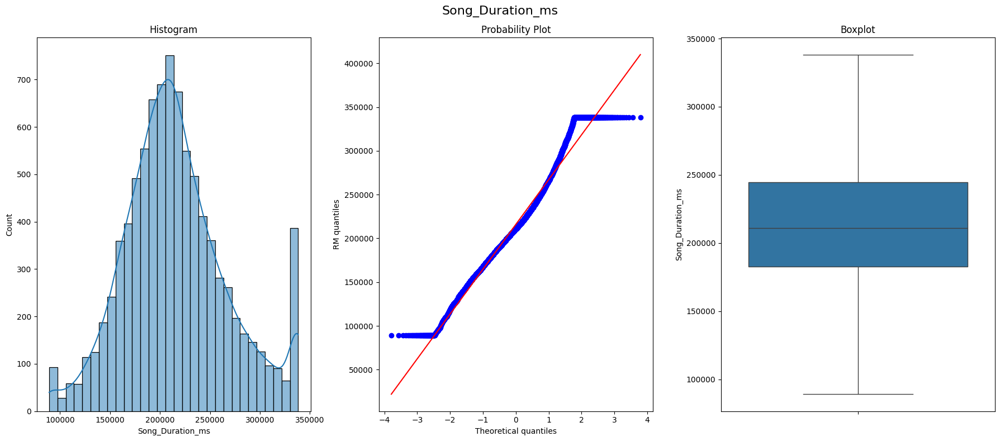

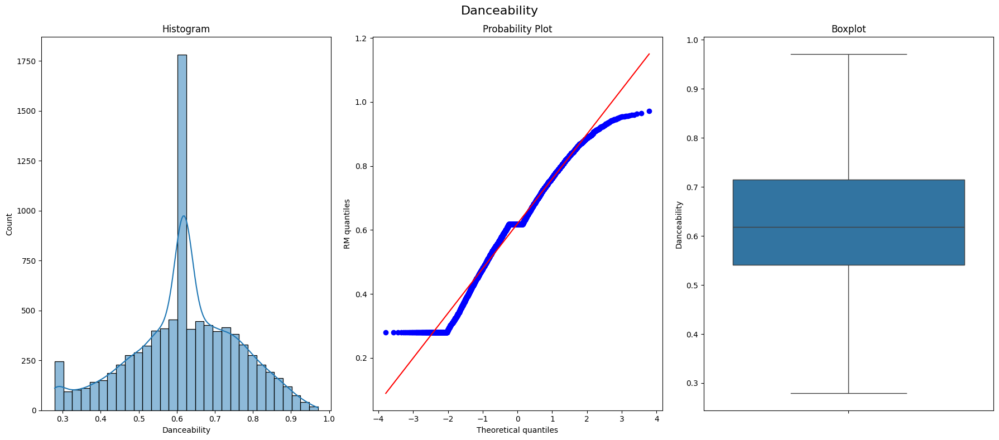

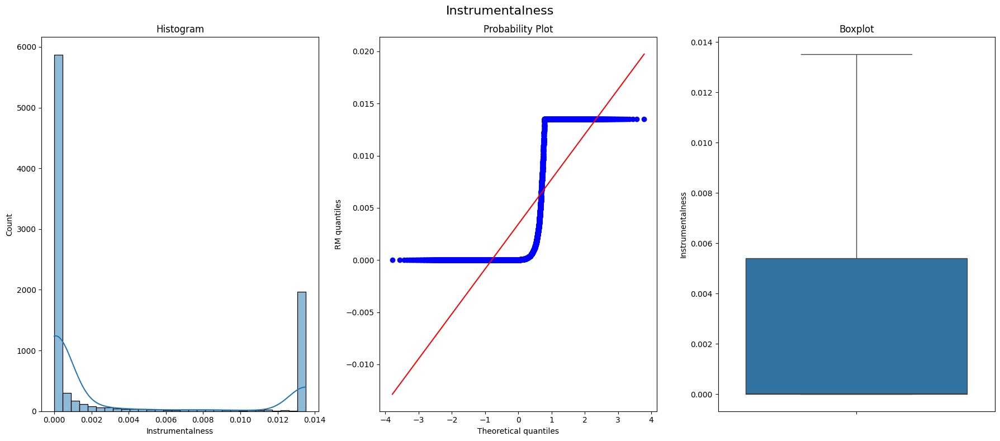

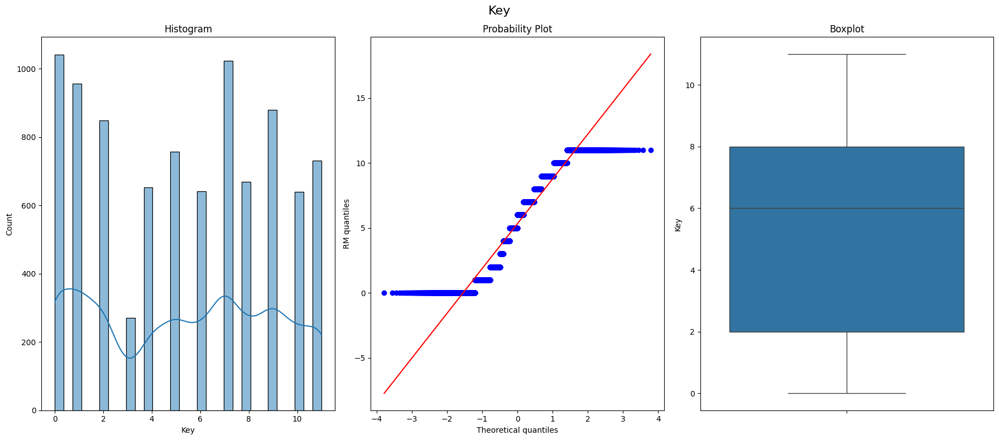

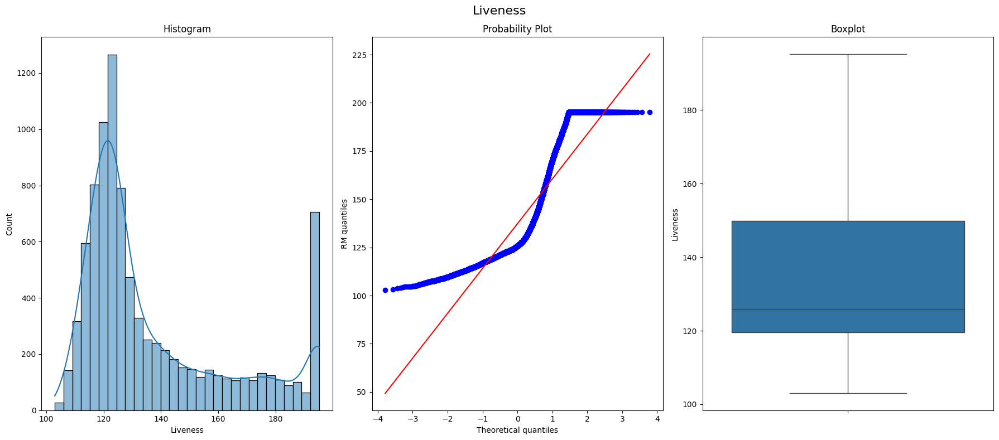

...

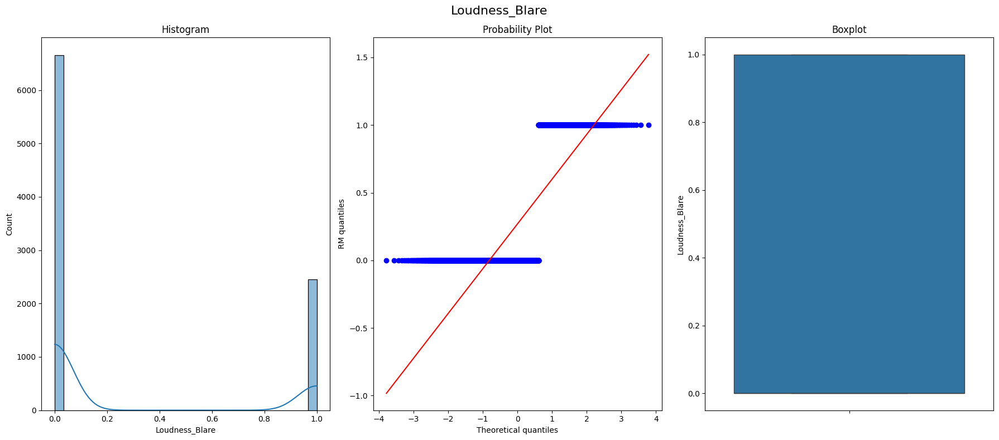

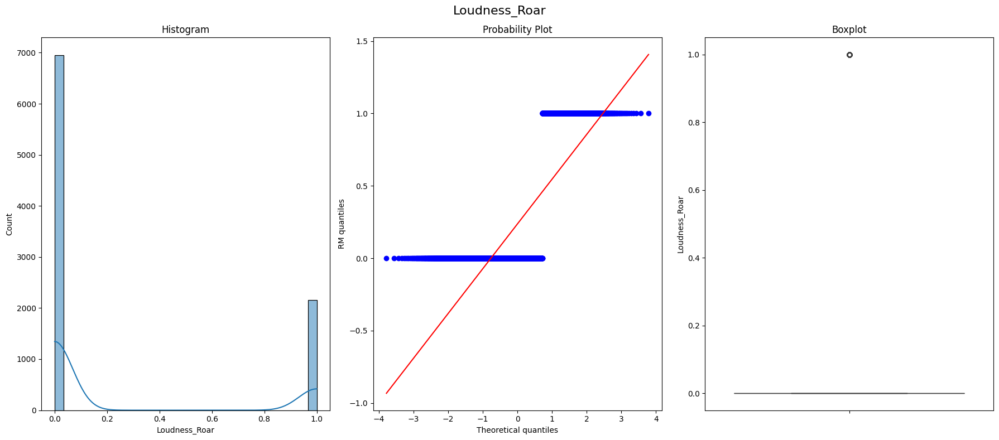

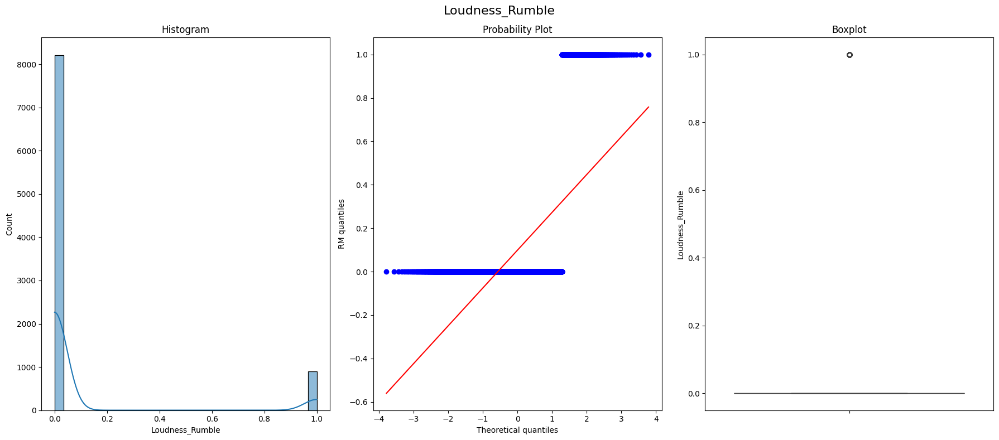

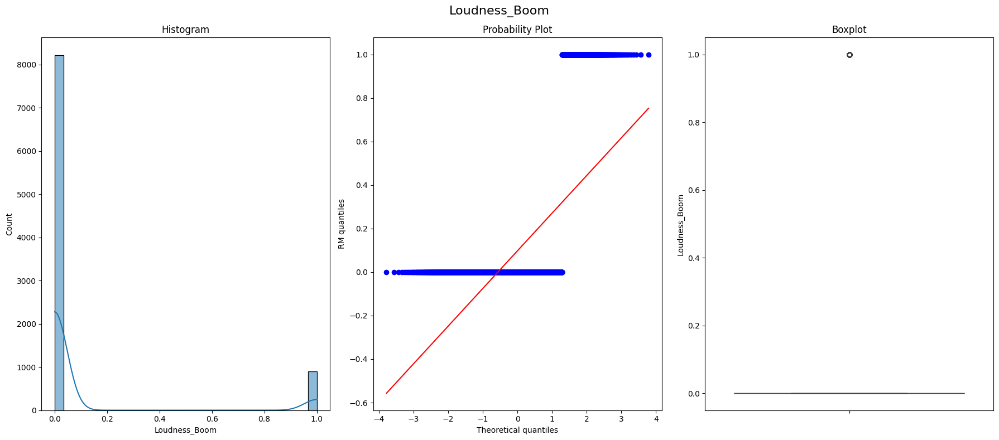

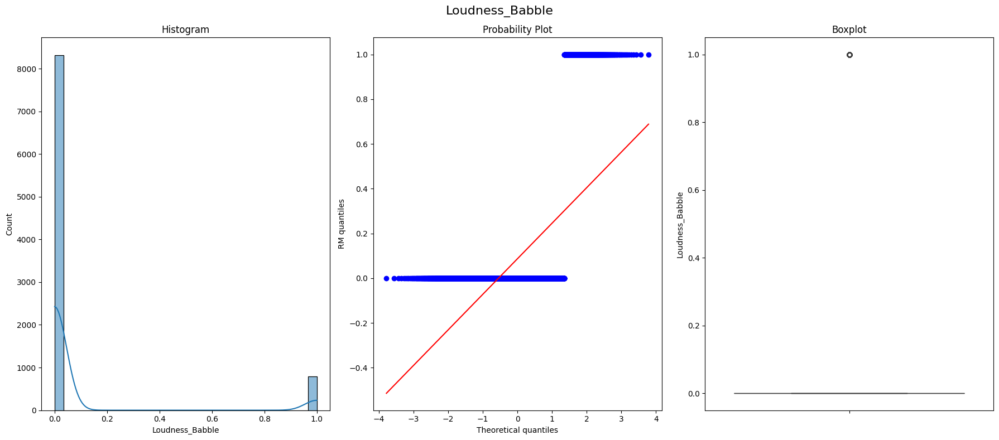

In [108]:
for i in X_train_enc:
    diagnostic_plots(X_train_enc, i)

I will perform both yeo johnson transformation on all variables 

For those values that are not very normally distributed, I will use stronger transformation methods and choose the one that gives me the most normal distribution

In [109]:
normal_variables_to_transform = ['Song_Duration_ms', 'Danceability', 'Tempo', 'Audio_valence', 'Decibel', 'Liveness', 'Speechiness']
jialat_variables_to_transform = ['Audio_valence', 'Liveness', 'Speechiness']

# Do one with 2 methods see which on work for audio valence

### Yeo Johnson

In [110]:
# initialize the transformer with a group of variables to transform
yjt = YeoJohnsonTransformer(variables = normal_variables_to_transform)

# fit transformer to the data set
yjt.fit(X_train_enc)

YeoJohnsonTransformer(variables=['Song_Duration_ms', 'Danceability', 'Tempo',
                                 'Audio_valence', 'Decibel', 'Liveness',
                                 'Speechiness'])

In [111]:
# transform the indicated variables in our dataframe
# returns a new dataframe

X_train_enc_yjt = yjt.transform(X_train_enc)
X_test_enc_yjt = yjt.transform(X_test_enc)

In [112]:
# the transformer stores the optimal parameter for each 
# variable in a dictionary in its attribute lambda_dict_

yjt.lambda_dict_

{'Song_Duration_ms': 0.5147298346218165,
 'Danceability': 2.0093649044062794,
 'Tempo': 0.2270384779335683,
 'Audio_valence': 0.8979841774254909,
 'Decibel': 1.9017114810346663,
 'Liveness': -3.4655742143441586,
 'Speechiness': -0.15957381288655828}

In [113]:
# the transformer stores the optimal parameter for each 
# variable in a dictionary in its attribute lambda_dict_

yjt.lambda_dict_

{'Song_Duration_ms': 0.5147298346218165,
 'Danceability': 2.0093649044062794,
 'Tempo': 0.2270384779335683,
 'Audio_valence': 0.8979841774254909,
 'Decibel': 1.9017114810346663,
 'Liveness': -3.4655742143441586,
 'Speechiness': -0.15957381288655828}

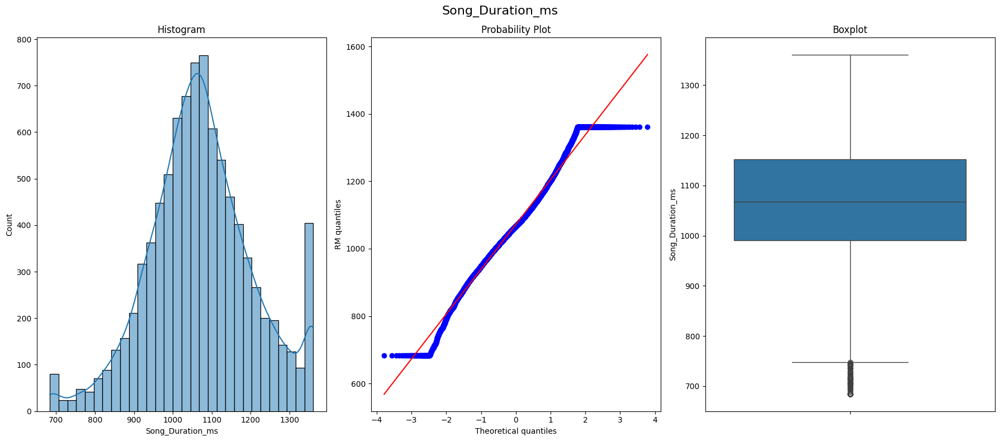

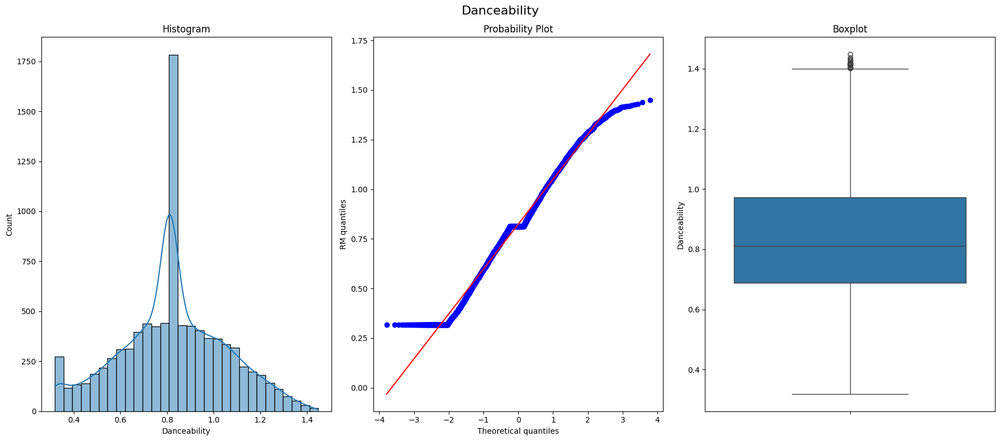

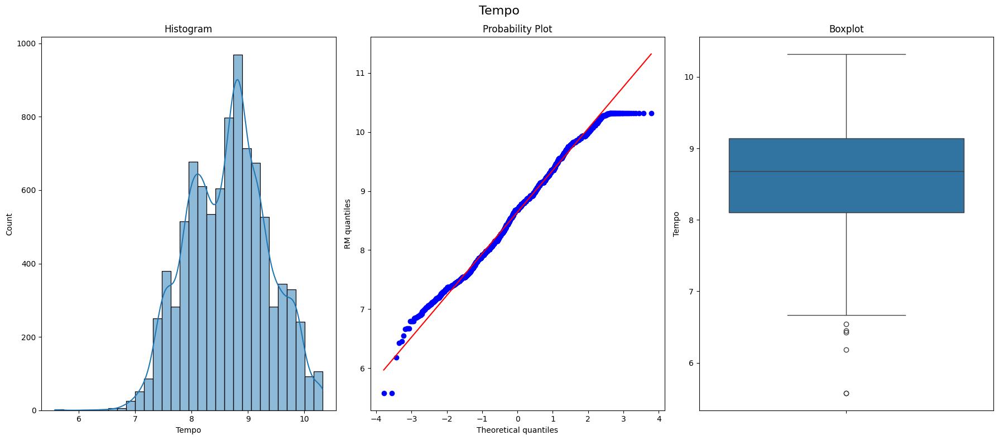

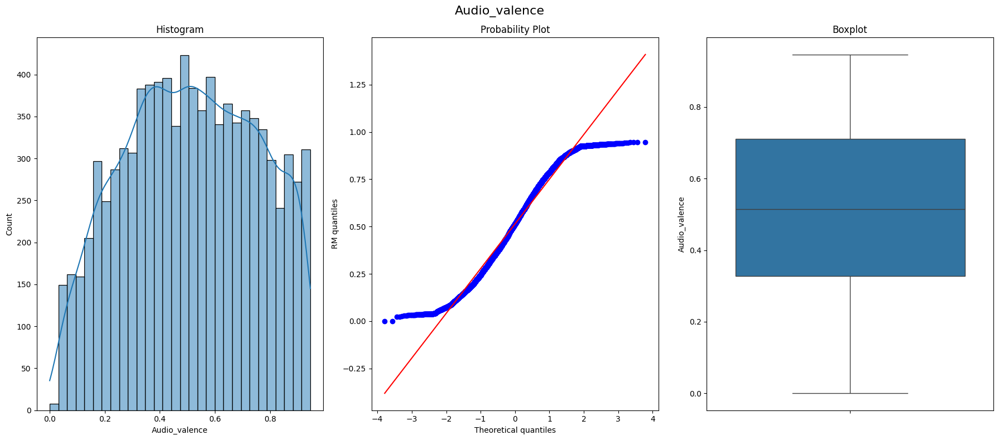

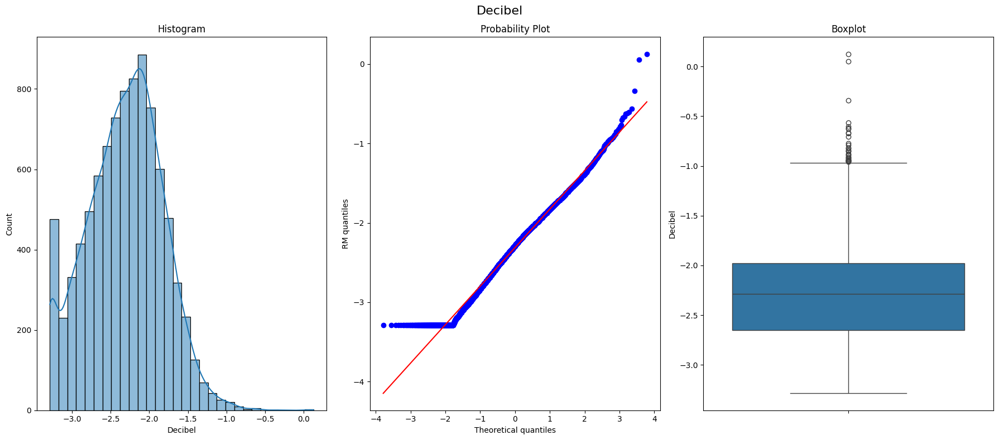

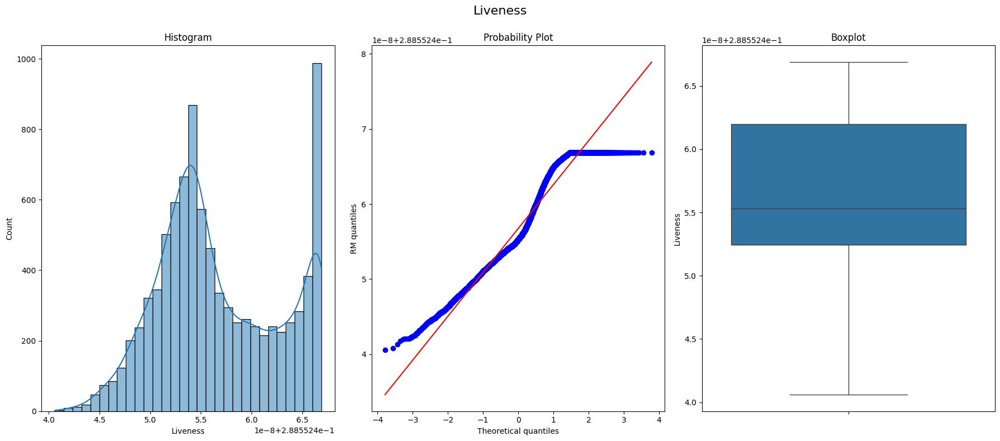

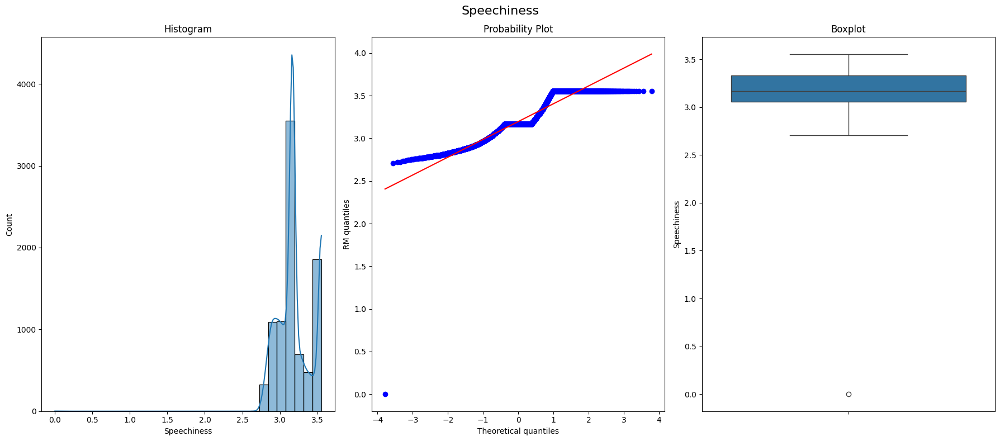

In [114]:
# visualize the distribution (not in book)
for i in normal_variables_to_transform:
    diagnostic_plots(X_train_enc_yjt, i)

In [115]:
for col in jialat_variables_to_transform:
    max_value = X_train_enc[col].max()
    min_value = X_train_enc[col].min()
    mean_value = X_train_enc[col].mean()
    print(f"'{col}': Max: {max_value}, Min: {min_value}, Mean: {mean_value:.3f}\n")

'Audio_valence': Max: 0.984, Min: 0.0, Mean: 0.528

'Liveness': Max: 195.215466, Min: 102.981904, Mean: 137.325

'Speechiness': Max: 189.075, Min: 0.0, Mean: 97.688



No 0 or negative values to transform

In [116]:
temp = X_train_enc.copy()

temp['Audio_valence'] += 1
temp['Speechiness'] += 1
temp['Decibel'] += 17.25


### Log Transformation

In [117]:
from feature_engine.transformation import LogTransformer
# initialize the transformer
lt = LogTransformer(variables=jialat_variables_to_transform)

# fit transformer to data set
lt.fit(temp)

LogTransformer(variables=['Audio_valence', 'Liveness', 'Speechiness'])

In [118]:
# transform variables within our data set
X_train_enc_lt = lt.transform(temp)

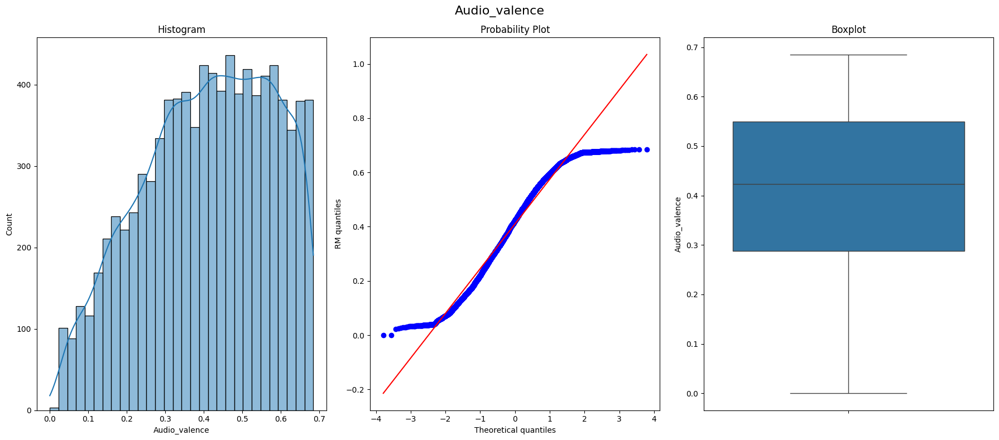

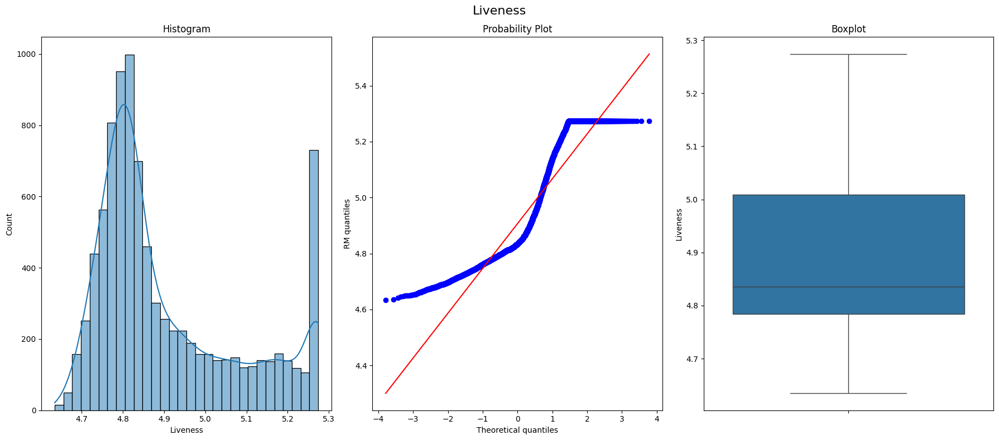

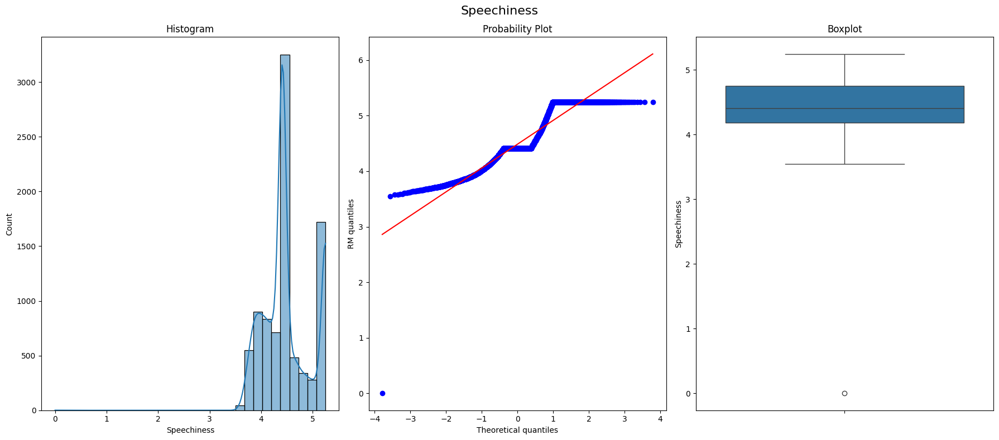

In [119]:
for i in jialat_variables_to_transform:
    diagnostic_plots(X_train_enc_lt, i)

### Power Transformation

In [120]:
from feature_engine.transformation import PowerTransformer
et = PowerTransformer(variables = jialat_variables_to_transform, exp=1/2)

# fit transformer to data 
et.fit(temp)

PowerTransformer(variables=['Audio_valence', 'Liveness', 'Speechiness'])

In [121]:
X_train_enc_et = et.transform(temp)

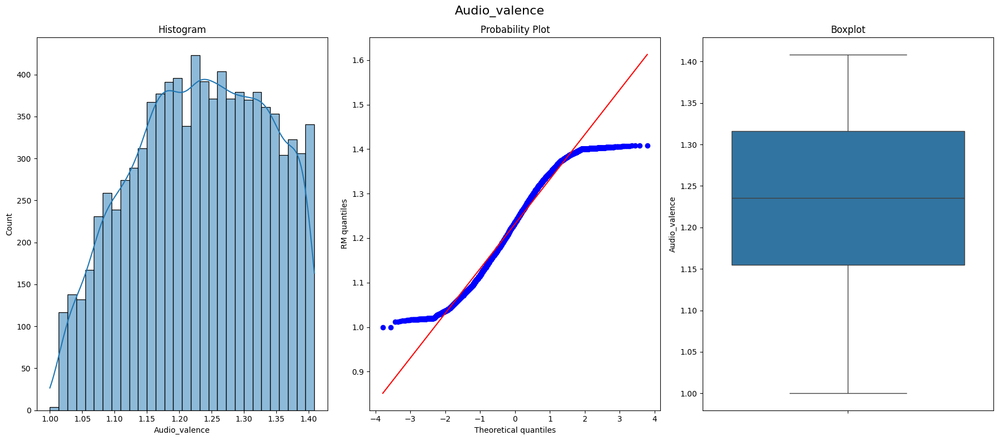

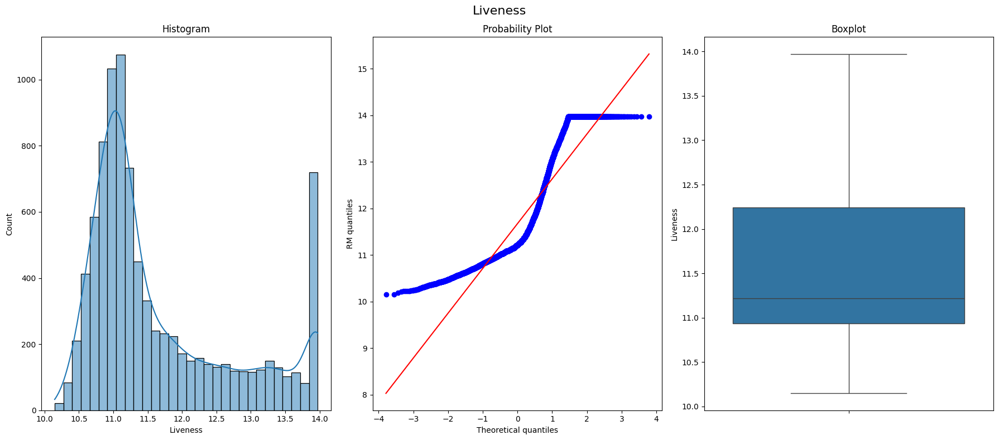

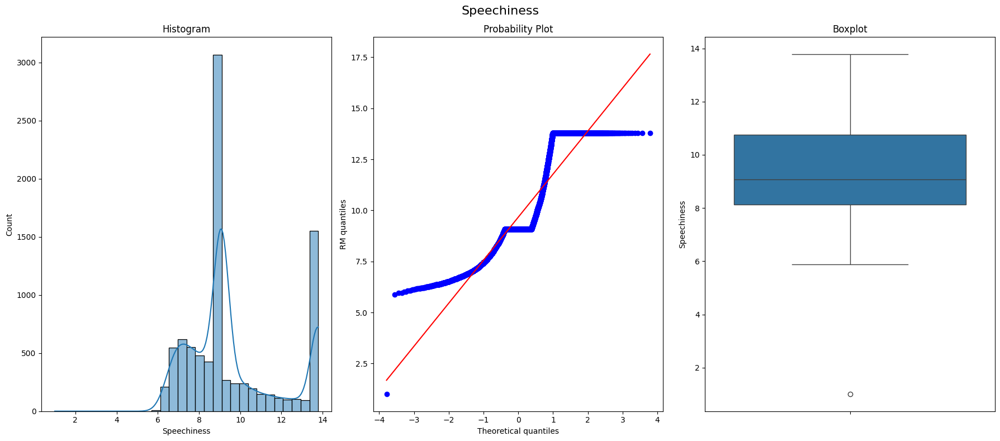

In [122]:
for i in jialat_variables_to_transform:
    diagnostic_plots(X_train_enc_et, i)

Even for the skewed data, Yeo Johnson transformation gave the most normal graph; I will use Yeo Johnson for all values

## Final Transformation

In [123]:
# initialize the transformer with a group of variables to transform
yjt = YeoJohnsonTransformer(variables = normal_variables_to_transform)

# fit transformer to the data set
yjt.fit(X_train_enc)

YeoJohnsonTransformer(variables=['Song_Duration_ms', 'Danceability', 'Tempo',
                                 'Audio_valence', 'Decibel', 'Liveness',
                                 'Speechiness'])

In [124]:
# transform the indicated variables in our dataframe
# returns a new dataframe

X_train_enc_tf = yjt.transform(X_train_enc)
X_test_enc_tf = yjt.transform(X_test_enc)

In [125]:
# the transformer stores the optimal parameter for each 
# variable in a dictionary in its attribute lambda_dict_

yjt.lambda_dict_

{'Song_Duration_ms': 0.5147298346218165,
 'Danceability': 2.0093649044062794,
 'Tempo': 0.2270384779335683,
 'Audio_valence': 0.8979841774254909,
 'Decibel': 1.9017114810346663,
 'Liveness': -3.4655742143441586,
 'Speechiness': -0.15957381288655828}

4a) 

Before starting on my encoding, I had already decided to use One Hot Encoding. However, I had to reduce the number of unique values to prevent the curse of dimensionality.

I decided to group all values that make up less than 5% of the overall as a new column named "Other"

Before encodig, I first sorted my columns so when I use drop_last = True, it will drop only the category with the lowest freuency. Doing so can help preserve my categories with a higher frequency, which are normally more influentional on the model. I also did that becasue I felt it was more consistent than dropping an arbituary column and was easier to understand.

The absence of the that column is intentional to prevent multicollinearity. For exmaple, the absence of a 1 in all other "Dynamism" columns ("Dynamism_High", "Dynamism_Extra High", "Dynamism_Med") implicitly indicates that the observation belongs to the "Low" category.

This can cause issues in models that rely on matrix inversion (like linear regression) because the presence of perfect multicollinearity can make the matrix singular and thus non-invertible.

I will now proceed to perform transformation on all continuous values. I plot all the data using my diagnostic plots to see the distribution of values. I seperated my variables into 2 arrays: normal and skewed. My normal array contains all continuous values, which I will perform Yeo Johnson transformation on. My skewed array contains only data with outliers and the shape is very far off from a normally distributed one. For this array, I will test out stronger transformation methods and compare all the transformation and choose the best one.

Before performing those stronger transformation methods, I checked the minimum value of those 3 columns. I then increased their value to be about 1 because those transformation methods only take positive values (No 0s or negative values). I used a temporary dataframe so I would not affect the dataframe that I would use in the future during the testing.

After using Yeo Johnson, Log, and Power transformation on the array, I discovered Yeo Johnson had the best results and made the distribution the most normal, which is what is best for the linear regression model. As such, I applied Yeo Johnson transformation to all columns in the data.

### Step 7: Variable Discretization /Binning

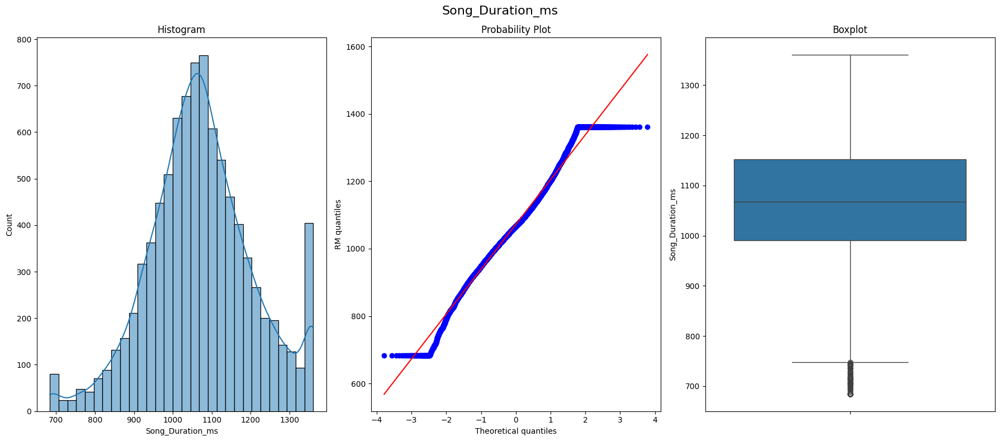

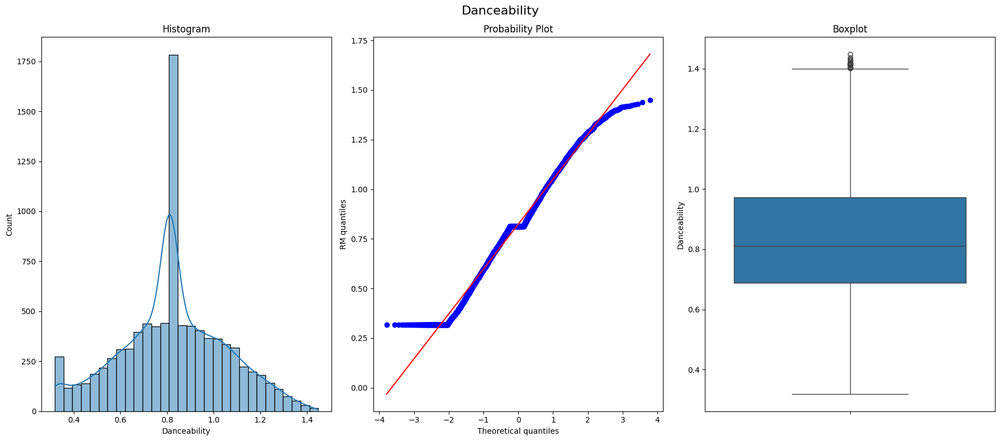

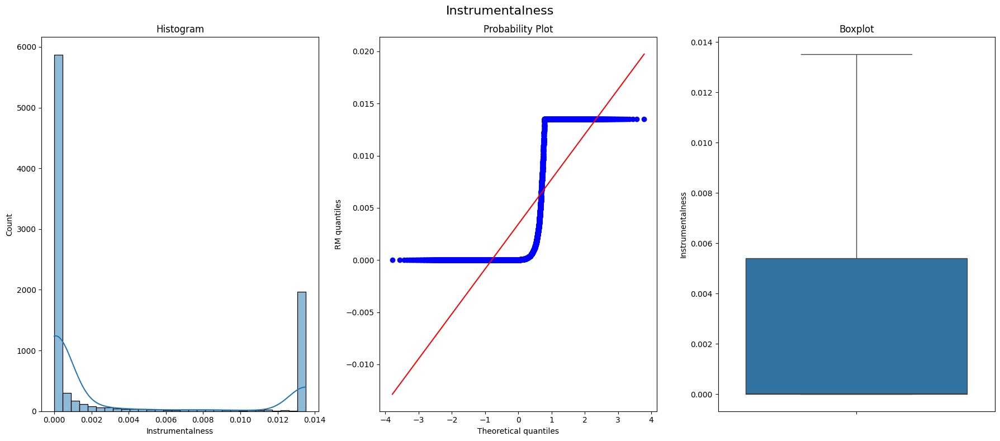

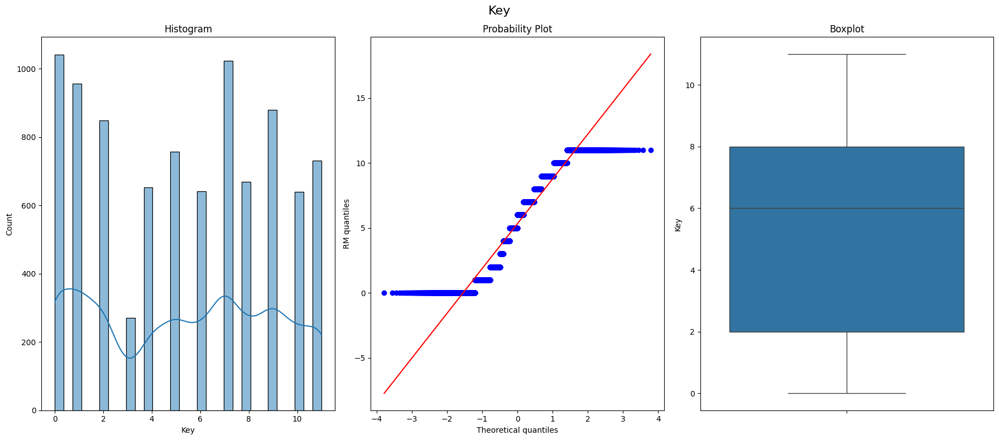

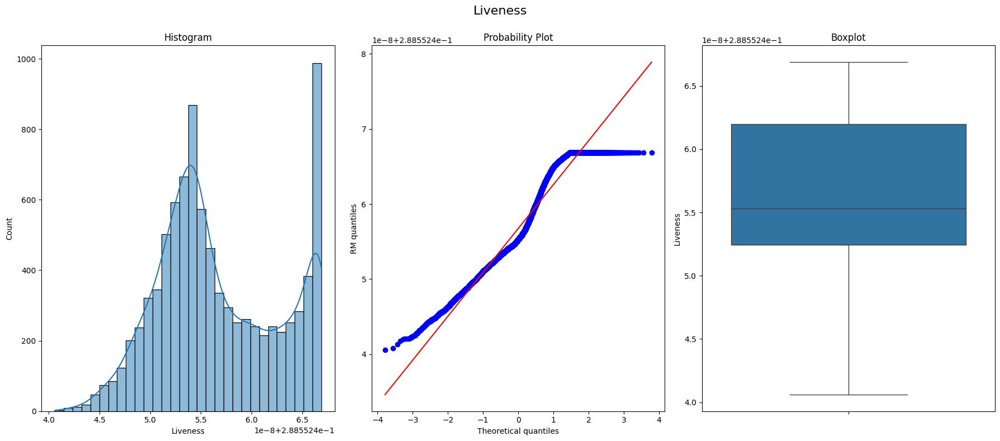

...

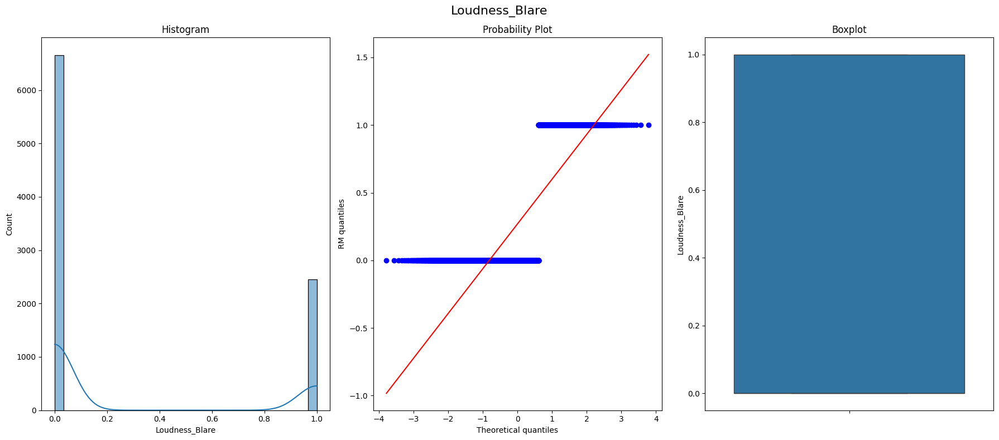

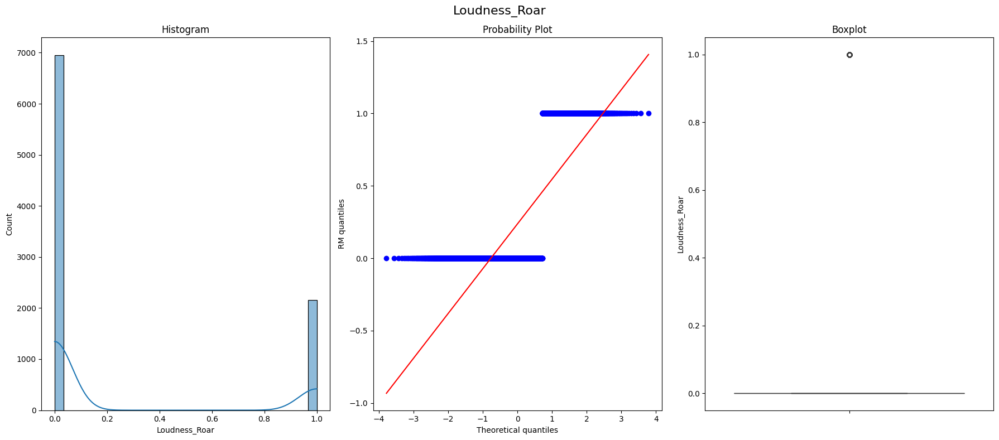

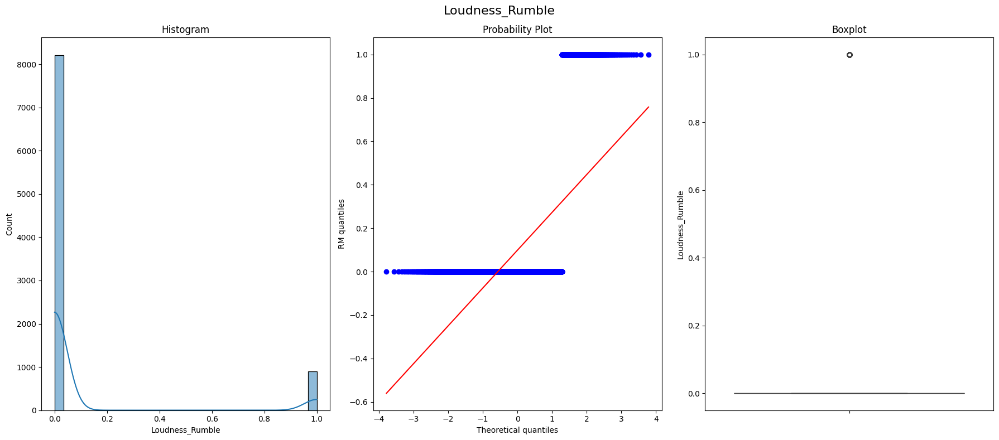

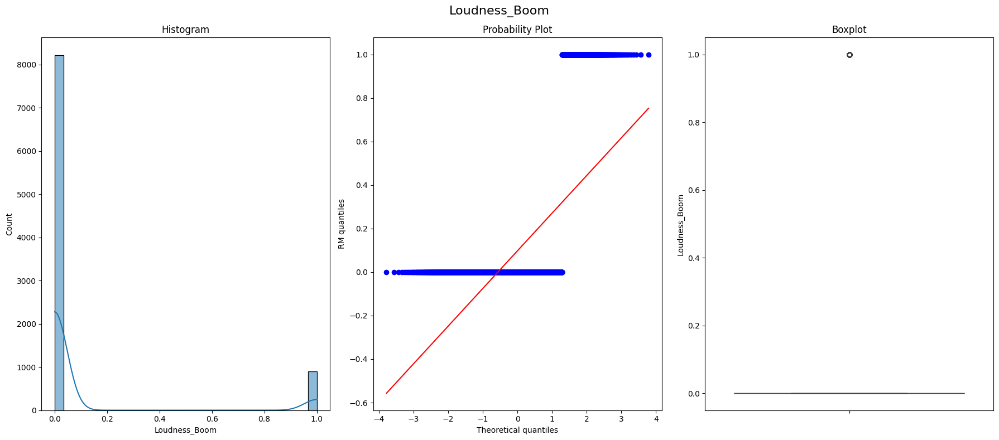

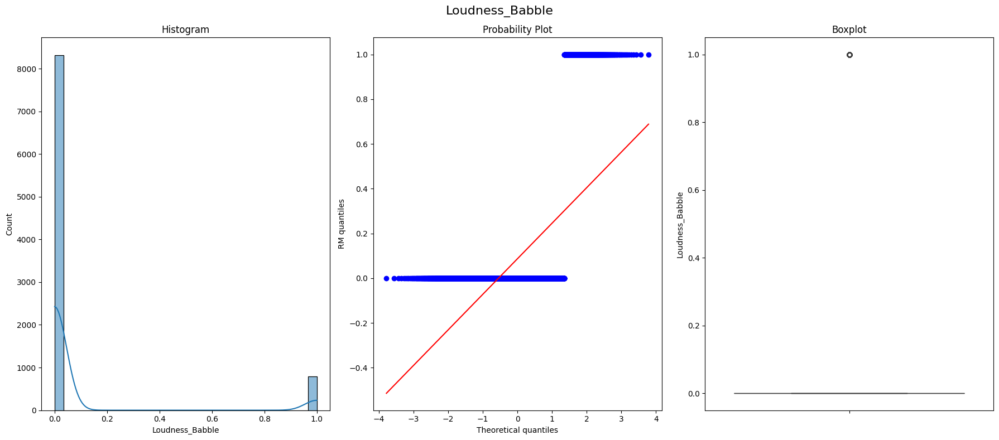

In [126]:
for i in X_train_enc_tf:
    diagnostic_plots(X_train_enc_tf, i)

In [127]:
from sklearn.preprocessing import StandardScaler
# set up the scaler
scaler = StandardScaler()

# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train_enc_tf)

StandardScaler()

In [128]:
# transform train and test sets
X_train_scaled = scaler.transform(X_train_enc_tf)
X_test_scaled = scaler.transform(X_test_enc_tf)

In [129]:
# the scaler stores the mean of the features, learned from train set

scaler.mean_

array([ 1.07213575e+03,  8.24005600e-01,  3.43778043e-03,  5.33252827e+00,
        2.88552457e-01,  6.33988363e-01,  3.19590017e+00,  8.64592621e+00,
        5.14108555e-01, -2.31202667e+00,  3.14084971e-01,  3.92359205e-01,
        2.04522999e-01,  1.59732133e-01,  2.69623449e-01,  2.37128115e-01,
        9.88033813e-02,  9.79251290e-02,  8.72763201e-02])

In [130]:
# the scaler stores the standard deviation deviation of the features,
# learned from train set

scaler.scale_

array([1.33765749e+02, 2.27556918e-01, 5.56996653e-03, 3.58072339e+00,
       5.99639104e-09, 4.81712693e-01, 2.19359201e-01, 7.08699778e-01,
       2.39475848e-01, 4.86445465e-01, 4.64150409e-01, 4.88276007e-01,
       4.03352627e-01, 3.66357447e-01, 4.43764177e-01, 4.25321493e-01,
       2.98397844e-01, 2.97213388e-01, 2.82239551e-01])

In [131]:
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train_enc_tf.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test_enc_tf.columns)


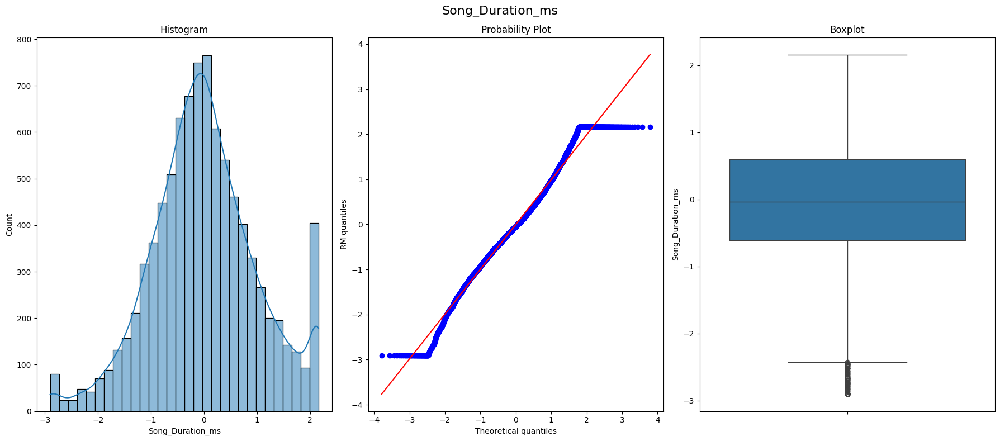

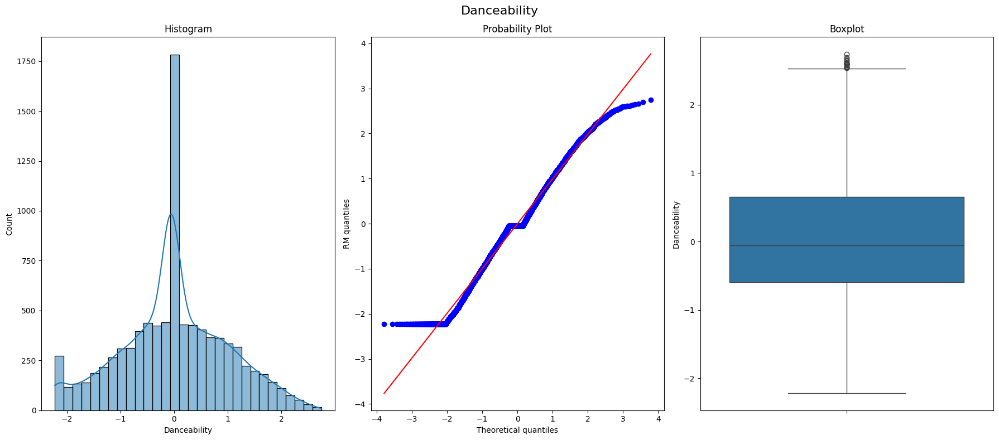

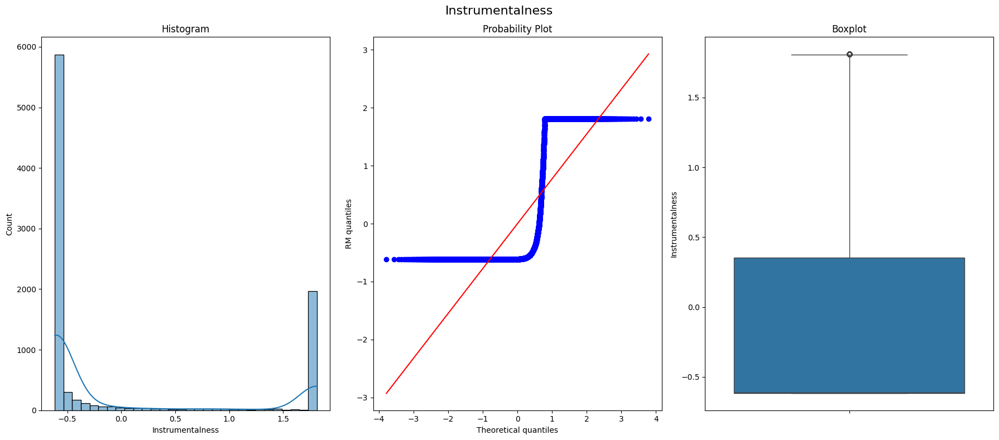

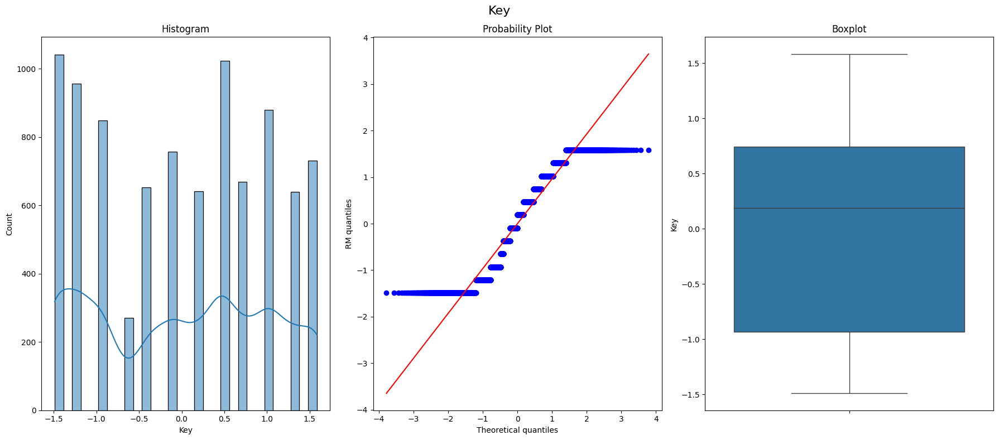

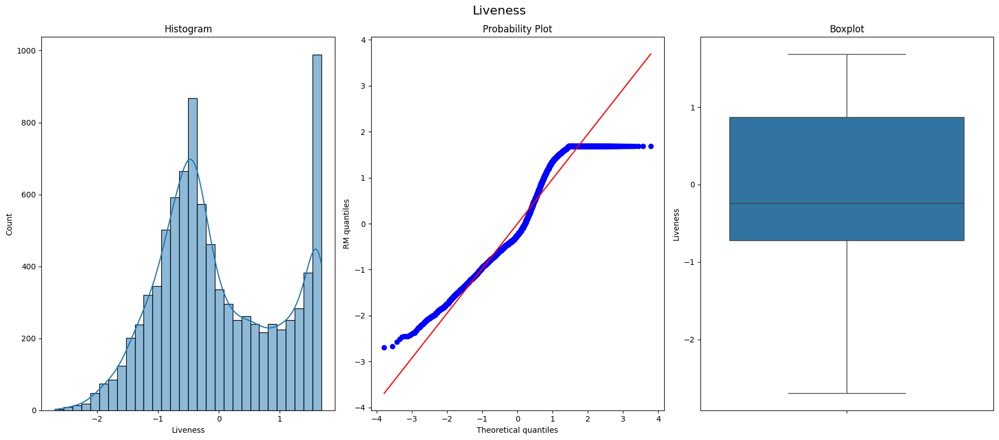

...

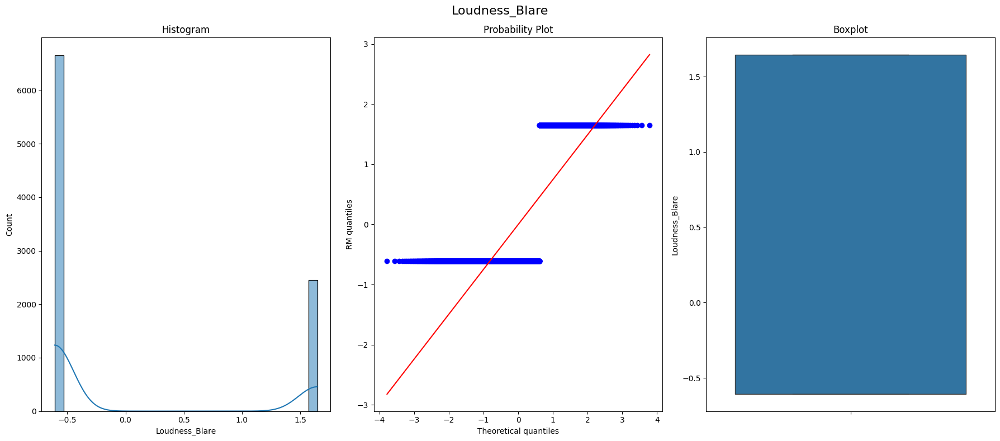

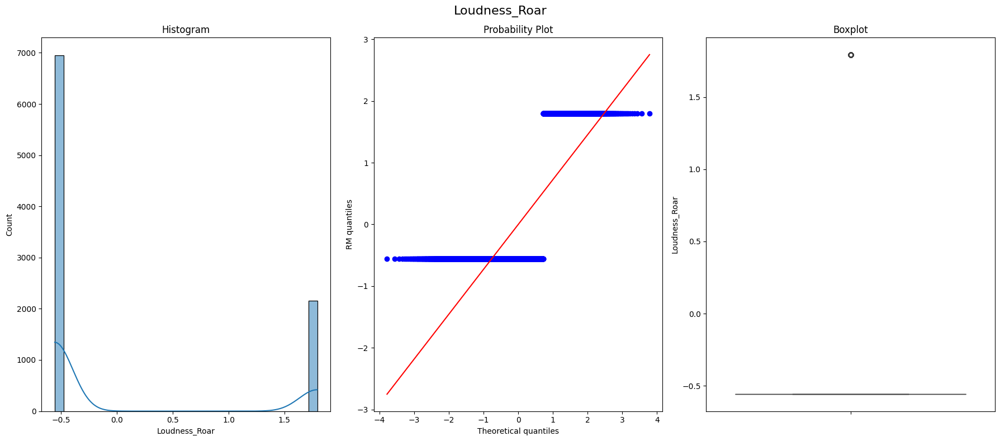

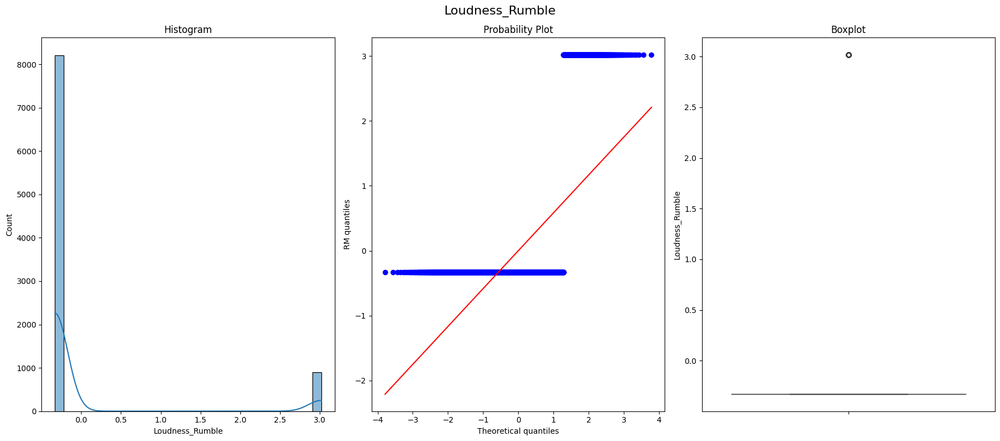

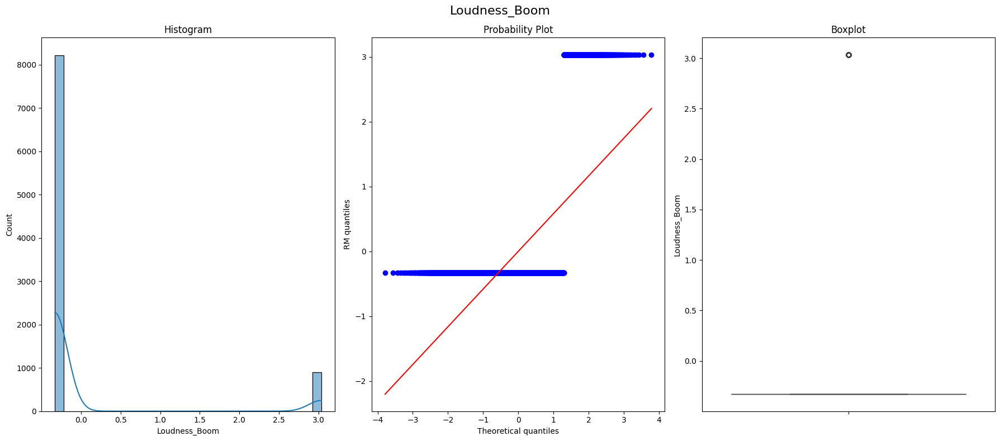

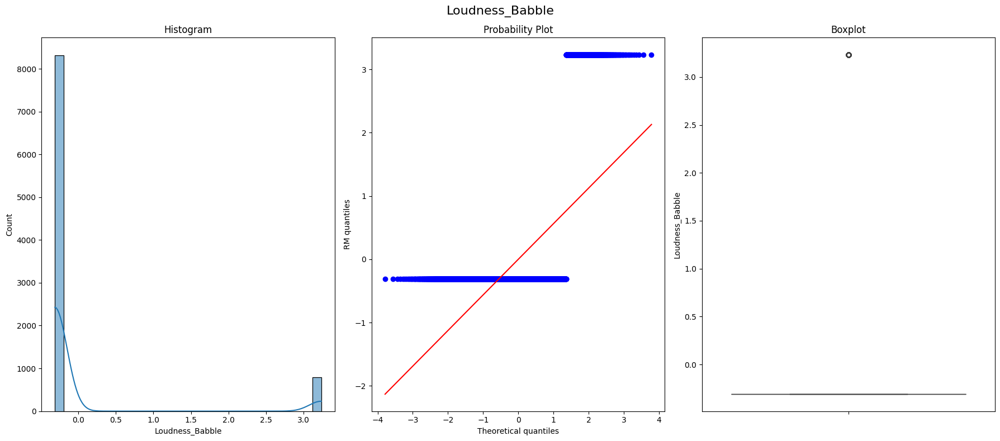

In [132]:
for i in X_train_scaled:
    diagnostic_plots(X_train_scaled, i)

5a)

I decided to scale up my data using standardisation to allow for every feature to contribute equally, regardless of their range. This will also ensure that outliers have less effect on the outcome of the linear regression model. Scaling is not only important for isolating predictive patterns, but is also a neccesity to do before performing other feature engineering methods such as PCA. Scaling all columns to have unit variance ensures each feature contributes equally, allowing PCA to accurately capture the most significant variances and patterns across all features.

Although the scaling of data did very minimal impact of the distribution of the graphs and only affected the range of values the data is plotted against, it is still a necessity as part of the best practices. This will help reduce a singular column having an exgagerated amount of variance in PCA due to its larger numerical range.

Perform Discretization of Non-Normal
- I will use Equal Width Discretization on Uniform shaped graphs
- I will use Equal Frequency Discretization on Skewed graphs with outliers

In [133]:
to_use_width = ['Tempo']
to_use_freq = ['Liveness', 'Speechiness', 'Audio_valence', 'Danceability']

In [134]:
from feature_engine.discretisation import EqualWidthDiscretiser

In [135]:
disc = EqualWidthDiscretiser(bins=30, variables = to_use_width)

disc.fit(X_train_scaled)

EqualWidthDiscretiser(bins=30, variables=['Tempo'])

In [136]:
disc.binner_dict_

{'Tempo': [-inf,
  -4.111487003524742,
  -3.888217290692587,
  -3.6649475778604317,
  -3.441677865028277,
  -3.2184081521961216,
  -2.9951384393639664,
  -2.7718687265318116,
  -2.548599013699657,
  -2.3253293008675016,
  -2.1020595880353463,
  -1.8787898752031915,
  -1.6555201623710363,
  -1.4322504495388815,
  -1.2089807367067262,
  -0.9857110238745714,
  -0.7624413110424162,
  -0.539171598210261,
  -0.31590188537810615,
  -0.09263217254595091,
  0.13063754028620433,
  0.3539072531183587,
  0.5771769659505139,
  0.8004466787826692,
  1.0237163916148244,
  1.2469861044469797,
  1.470255817279134,
  1.6935255301112893,
  1.9167952429434445,
  2.1400649557755997,
  inf]}

In [137]:
X_train_scaled_disc = disc.transform(X_train_scaled)
X_test_scaled_disc = disc.transform(X_test_scaled)

Text(0, 0.5, 'Number of observations per bin')

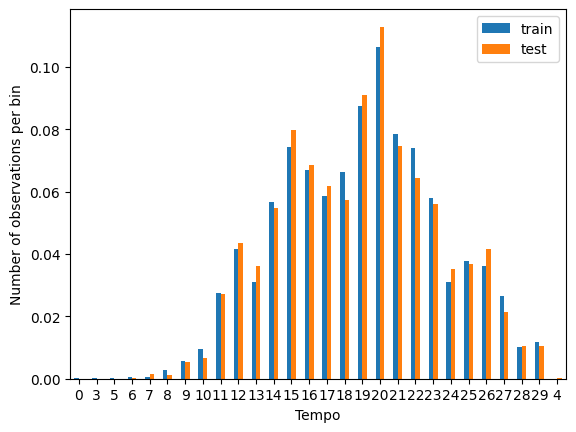

In [138]:
t1 = X_train_scaled_disc.groupby(['Tempo'])['Tempo'].count() / len(X_train_scaled_disc)
t2 = X_test_scaled_disc.groupby(['Tempo'])['Tempo'].count() / len(X_test_scaled_disc)

tmp = pd.concat([t1, t2], axis=1)
tmp.columns = ['train', 'test']

tmp.plot.bar()
plt.xticks(rotation=0)
plt.ylabel('Number of observations per bin')

In [139]:
from feature_engine.discretisation import EqualFrequencyDiscretiser

In [140]:
disc_f = EqualFrequencyDiscretiser(q=30, variables = to_use_freq)

disc_f.fit(X_train_scaled_disc)

EqualFrequencyDiscretiser(q=30,
                          variables=['Liveness', 'Speechiness', 'Audio_valence',
                                     'Danceability'])

In [141]:
# in the binner dict, we can see the limits of the intervals
# for each variable

disc_f.binner_dict_

{'Liveness': [-inf,
  -1.6052664619401302,
  -1.3611598496178565,
  -1.1877282495338972,
  -1.050487841217752,
  -0.9295233315741637,
  -0.8414604333658229,
  -0.7599561480380507,
  -0.6823759841066421,
  -0.6085074206756279,
  -0.5471392810232191,
  -0.47885245531970855,
  -0.428895325457988,
  -0.3799881636885139,
  -0.31636919179448214,
  -0.23932208160815419,
  -0.1649272612348293,
  -0.06503645983094437,
  0.06951823010395876,
  0.2192441762563863,
  0.4007980260064837,
  0.573488741261818,
  0.7633477526200886,
  0.9617686895767549,
  1.1491476270331151,
  1.3250361444915442,
  1.453009072424379,
  1.5708638179939098,
  inf],
 'Speechiness': [-inf,
  -1.6249333913399686,
  -1.4531178587811562,
  -1.3161412482887764,
  -1.1737102589628563,
  -1.0275026853364073,
  -0.8789770652633491,
  -0.7349293366403337,
  -0.5694547714121442,
  -0.4118601341546216,
  -0.22668962422188085,
  -0.12793916540919698,
  0.01231881602061745,
  0.23849874927877382,
  0.47367649005480594,
  0.778573668

In [142]:
# transform train and test sets

X_train_enc_tf_disc = disc_f.transform(X_train_scaled_disc)
X_test_enc_tf_disc = disc_f.transform(X_test_scaled_disc)

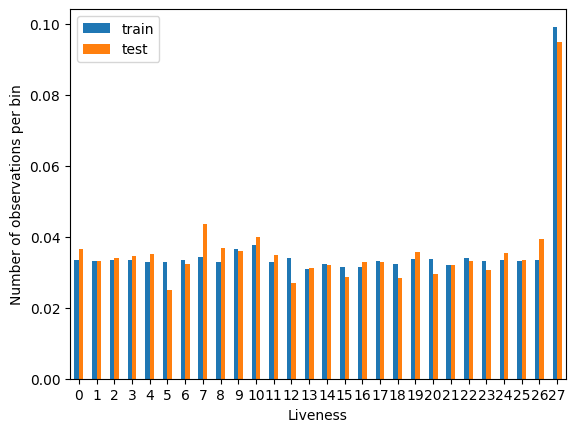

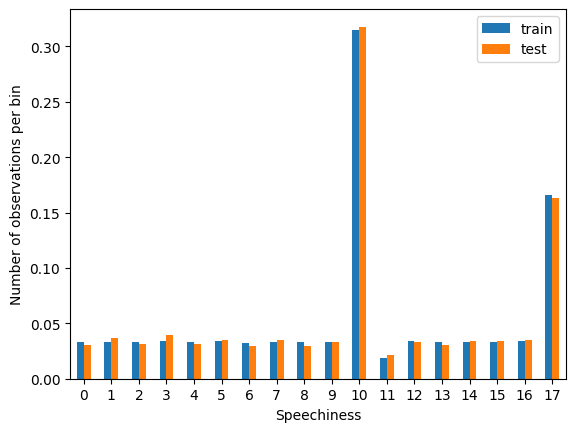

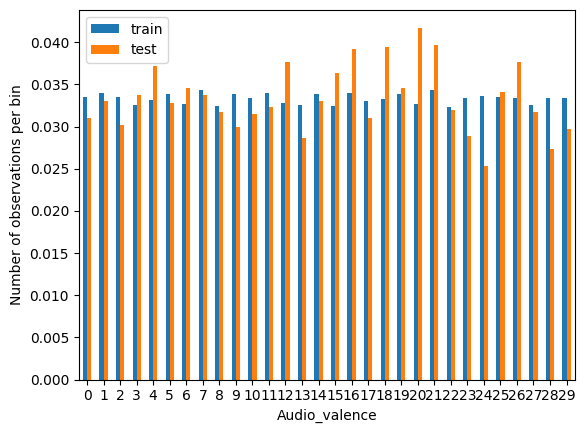

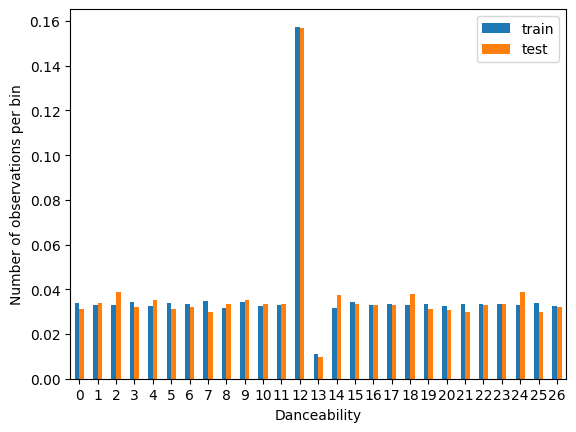

In [143]:
for i in to_use_freq:
    t1 = X_train_enc_tf_disc.groupby([i])[i].count() / len(X_train_enc_tf_disc)
    t2 = X_test_enc_tf_disc.groupby([i])[i].count() / len(X_test_enc_tf_disc)

    tmp = pd.concat([t1, t2], axis=1)
    tmp.columns = ['train', 'test']
    tmp.plot.bar()
    plt.xticks(rotation=0)
    plt.ylabel('Number of observations per bin')

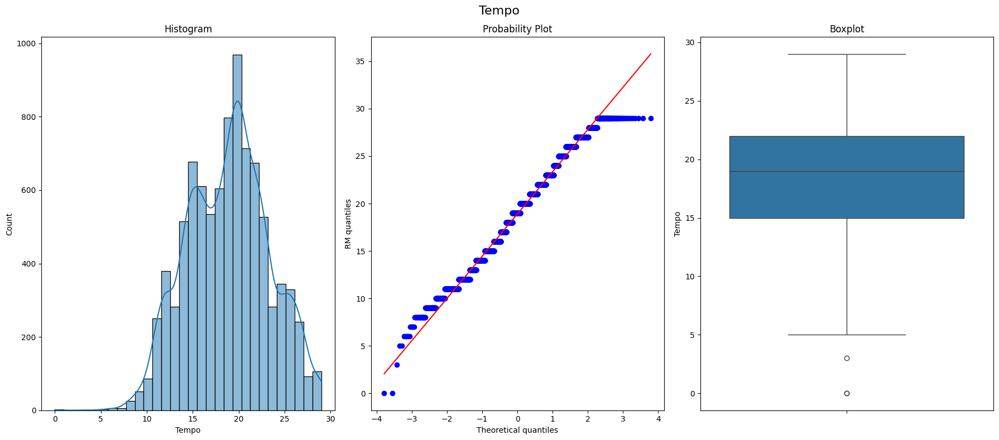

In [144]:
for i in to_use_width:
    diagnostic_plots(X_train_enc_tf_disc, i)

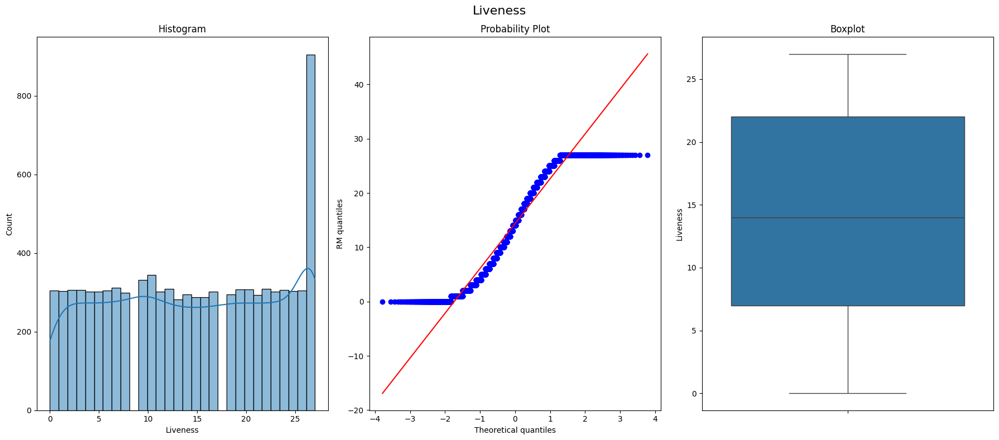

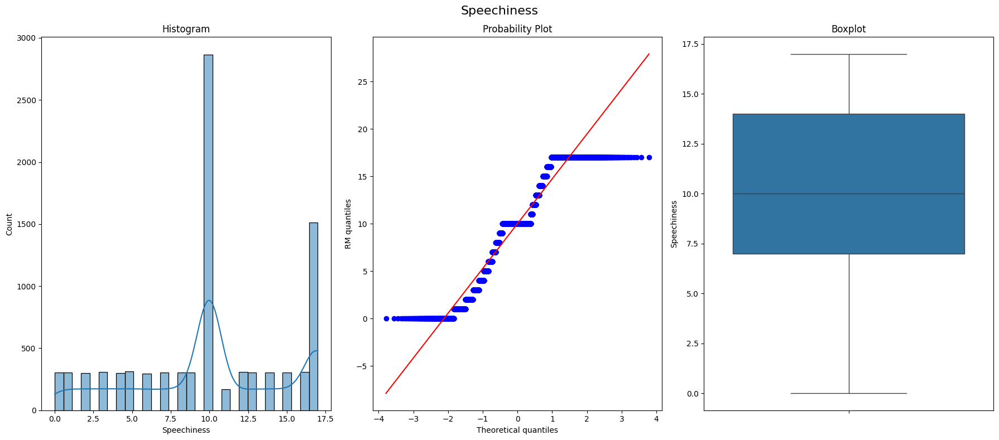

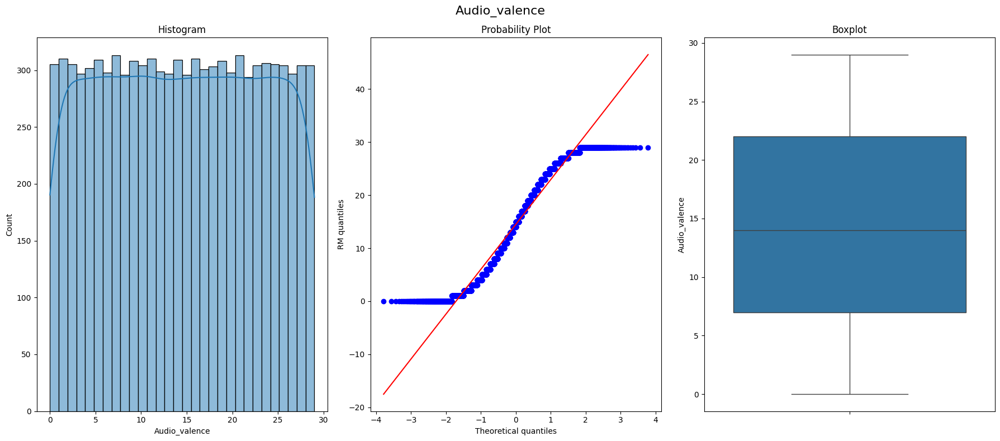

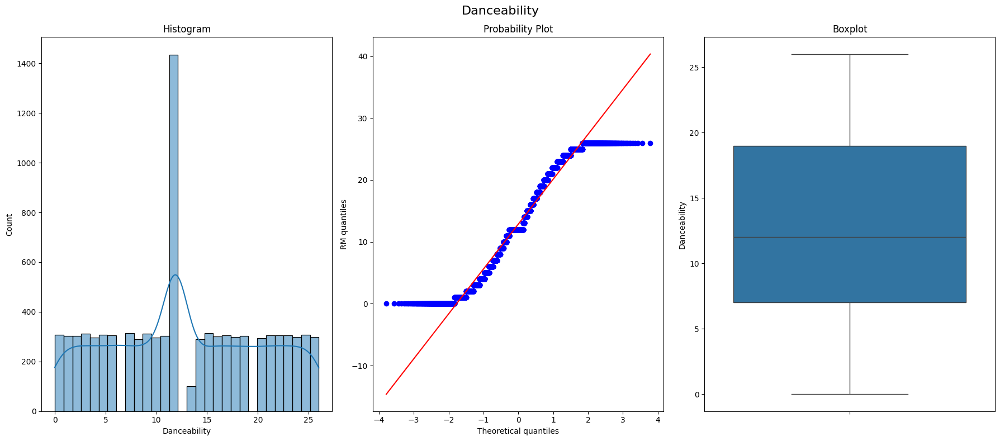

In [145]:
for i in to_use_freq:
    diagnostic_plots(X_train_enc_tf_disc, i)

4b)

Even after transformation, there are still skewed data with outliers. I will perform data discretisation to attempt to make those variables more normal. After checking the distribution of the graphs, I have decided on five variables: "Tempo", "Liveness", "Speechiness", "Audio_valence", "Danceability". I chose my discretization method based on the distribution of the columns. If they were more uniform, I would use Equal Width Discretisation and if they were more skewed with outliers, I would perform Equal Frequency Discretisation instead.

Initially, I used decibel as well. However, it ended up negatively affecting my r-square value when using equal width discretiser. Even after changing it to use equal frequency discretization, it barely affected the model. As such, I did not perform discretisation on it during my final verison. I think that although equal frequency discretization requires skewed graphs with outliers, the skew needs to be either on both sides or in the case of being only on one side, be a large skew with a long tail on the qq plot like for "Audio_valance".

The steps I did, but with Decibel column this time below

Decibel using Equal Frequency

In [146]:
wanted_to_use_width = ['Tempo']
wanted_to_use_freq = ['Liveness', 'Speechiness', 'Audio_valence', 'Danceability', 'Decibel']

In [147]:
disc = EqualWidthDiscretiser(bins=30, variables = wanted_to_use_width)

disc.fit(X_train_scaled)

EqualWidthDiscretiser(bins=30, variables=['Tempo'])

In [148]:
X_train_decibel_freq = disc.transform(X_train_scaled)
X_test_decibel_freq = disc.transform(X_test_scaled)

Decibel using Equal Width

In [149]:
wanted_to_use_width_2 = ['Tempo', 'Decibel']
wanted_to_use_freq_2 = ['Liveness', 'Speechiness', 'Audio_valence', 'Danceability']

In [150]:
disc = EqualWidthDiscretiser(bins=30, variables = wanted_to_use_width_2)

disc.fit(X_train_scaled)

EqualWidthDiscretiser(bins=30, variables=['Tempo', 'Decibel'])

In [151]:
X_train_decibel_width = disc.transform(X_train_scaled)
X_test_decibel_width = disc.transform(X_test_scaled)

### Step 8: Feature Engineer

In [152]:
X_train_feature = X_train_enc_tf_disc.copy()
X_test_feature = X_test_enc_tf_disc.copy()

In [153]:
X_train_feature.columns

Index(['Song_Duration_ms', 'Danceability', 'Instrumentalness', 'Key',
       'Liveness', 'Audio_mode', 'Speechiness', 'Tempo', 'Audio_valence',
       'Decibel', 'Dynamism_Med', 'Dynamism_High', 'Dynamism_Low',
       'Loudness_Clang', 'Loudness_Blare', 'Loudness_Roar', 'Loudness_Rumble',
       'Loudness_Boom', 'Loudness_Babble'],
      dtype='object')

In [154]:
from sklearn.decomposition import PCA

In [155]:
# set up the PCA

pca = PCA()

In [156]:
# train the PCA
# insert code here
pca.fit(X_train_feature)

PCA()

In [157]:
train_t = pca.transform(X_train_feature)
test_t = pca.transform(X_test_feature)

In [158]:
# show the variance explanation for each Principal Component
print(len(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)

19
[3.40647105e-01 2.76150372e-01 1.71503607e-01 8.86387557e-02
 7.05235853e-02 9.08235315e-03 5.68002222e-03 5.11721506e-03
 4.63050707e-03 4.52585640e-03 4.33264158e-03 4.22741929e-03
 4.01393024e-03 3.59698266e-03 3.23380924e-03 2.94071517e-03
 6.35497507e-04 3.75870880e-04 1.43754284e-04]


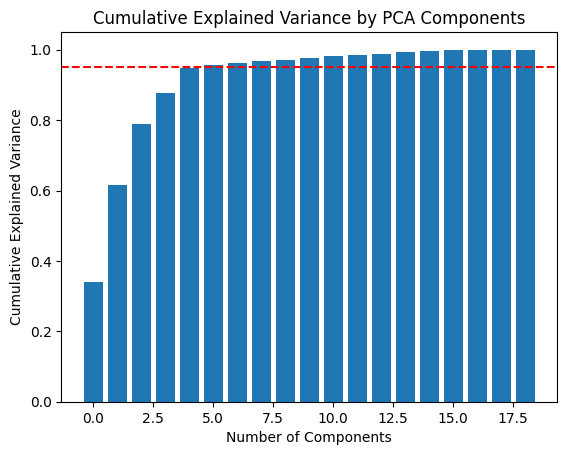

In [159]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = len(cumulative_variance)
plt.bar(range(num_components), cumulative_variance, label='Cumulative Explained Variance')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Explained Variance')

plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')


plt.show()

Make mulitiple PCA

In [160]:
# PCA - 5
pca_5 = PCA(n_components=5)

pca_5.fit(X_train_feature)
train_t_5 = pca_5.transform(X_train_feature)
test_t_5 = pca_5.transform(X_test_feature)

In [161]:
# PCA - 6
pca_6 = PCA(n_components=6)

pca_6.fit(X_train_feature)
train_t_6 = pca_6.transform(X_train_feature)
test_t_6 = pca_6.transform(X_test_feature)

In [162]:
pca_final = PCA(n_components=10)

pca_final.fit(X_train_feature)
train_t_final = pca_final.transform(X_train_feature)
test_t_final = pca_final.transform(X_test_feature)

In [163]:
pca_full = PCA()
pca_full.fit(X_train_feature)

# Loadings for the sixth component
sixth_component_loadings = pca_full.components_[5]

In [164]:
sixth_component_loadings

array([-0.12298312,  0.00336086,  0.16200204, -0.01383962,  0.0180517 ,
        0.0541084 ,  0.05675358,  0.04273572,  0.03181958, -0.52287198,
        0.36068002, -0.40179391,  0.15847971,  0.18462855, -0.3550036 ,
       -0.05240748,  0.22904928, -0.21476071,  0.31245383])

In [165]:
feature_names = X_train_feature.columns

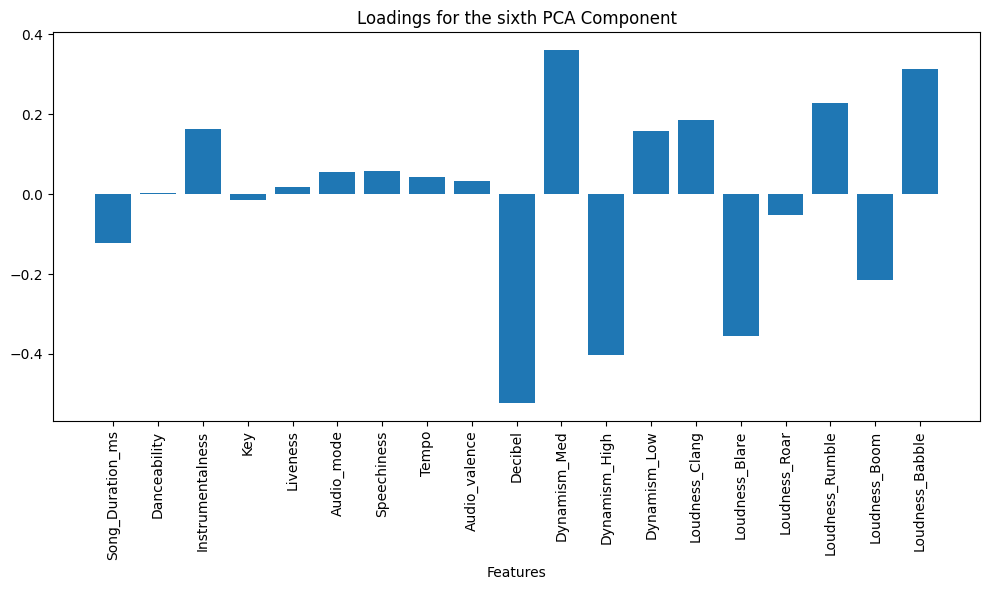

In [166]:
plt.figure(figsize=(10, 6))
plt.bar(feature_names, sixth_component_loadings)
plt.xlabel('Features')
plt.title('Loadings for the sixth PCA Component')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

5b)

After scaling the data, I performed Principle Component Analysis (PCA) towards my dataset. I then Printed the amount of columns in my PCA, which was 19.

In order to reduce the amount of noise and dimensionality, I decided the plot the cumulative explained variance by PCA components, starting with the Principle Component that influences the result the most. Using 95% cumulative explained variance, I notice that out of my 19 principle components, I only needed 5 of them to reach my achieved goal of 95%. Although having more columns and principle components will improve my model, albeit slightly, I choose to retain only my first 5 principle comopents, and remove the remaining 14 in order to reduce the number of features. Taking into account that 95% of my cumulative explained variance will be preserved, I am aiming to reduce the dimensionality of my dataset to avoid the curse of dimesionality, all the while ensuring my model will still produce good results. This also helps to "reduce noise" my smoothing or filtering out noise from data that does not affect the model results by keeping only the components with the highest variance, which are often signals and help to indicate patterns. Aside from that, lowering the dimesionality of the data will help the linear regression model training more efficiently, since it does not have to bother with insignificant and "useless" data. This will inrcease the speed of the computation, all the while lowering the amount of resources required.

Efficiency aside, since this process helps to reduce the dimensionality of the data, it prevents overfitting and allows the model to be applied to a wide array of different data with similar results. This means our company can simply use an api to feed in newly released songs from various platforms such as Soundcloud to easily pick out potential hits and offer the artists contracts.

After I performed PCA, I chose the number of components to be 5 and used it to perform testing. However, that got me a train_r-sq of 0.126, much lower than the train_r-sq of 0.411 with my full dataset.

As such, I decided to check what happens when my components was set to 6, my train_r-sq shot all the way up to 0.327. Because of this, I decided to delve deeper into what makes up that component because obviously, it was very important in my prediction of the dataset.

After making another PCA object and fitting it, I then plot the loadings for the sixth PCA component. Each singular loading was mapped with the corresponding column name from the X_train_feature. Doing so, I began to take note of any large values, in either the positive or negative direction. From the graph, I have denoted 5 features with notable values:

- Decibel
- Dynamism_med
- Dynamism_High
- Loudness_Blare
- Loudness_Babble

I will have to keep these in mind when doing more detailed analysis in future reports.

As for the chosen number of components, I have decided on 10 as it results in a train_r-sq value of 0.381, which is close to the 0.411 of the full dataset, while only requiring half the data, which increases efficiency and reduces dimensionality

### Step 9: Linear Regression Modelling

- Mean Square Error (MSE): The MSE is the variance of the residuals, that is, the squared differences between prediction and actual observation. Lower values of MSE indicate better fit and model performance.
- R-Square: R-square represents the percentage of the response variable variation that is explained by a linear model. The closer to 1.0 the value of R-square, the more indicative of a better fit and model performance.

In [167]:
X_train_final = X_train_enc_tf_disc
X_test_final = X_test_enc_tf_disc
y_train_final = y_train
y_test_final = y_test

In [168]:
# assign your fully cleaned and transformed data contained within your versions of 
# X_train_student_final_premodel_version, X_test_student_final_premodel_version,
# y_train_student_final_premodel_version and y_test_student_final_premodel_version into
# the prepared variables below, for a simple linear regression model

In [169]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

### Final

In [170]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_final)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_final)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_final)))

train_mse: 99.60422388013744 
 test_mse: 99.13642358579956
train_r-sq: 0.4112231192124284 
 test_r-sq: 0.4093305952882319


### Value after scaling

In [171]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_scaled, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_scaled)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_scaled)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_scaled)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_scaled)))

train_mse: 99.6035274846429 
 test_mse: 99.28027030550476
train_r-sq: 0.4112272357202541 
 test_r-sq: 0.40847353535783737


### Decibel Result - Width

In [172]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_decibel_width, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_decibel_width)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_decibel_width)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_decibel_width)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_decibel_width)))

train_mse: 99.75229870779197 
 test_mse: 99.53022990185066
train_r-sq: 0.41034782465409225 
 test_r-sq: 0.4069842392884886


### Decibel Result - Frequency

In [173]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(X_train_decibel_freq, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(X_train_decibel_freq)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(X_test_decibel_freq)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(X_train_decibel_freq)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(X_test_decibel_freq)))

train_mse: 99.60519464288373 
 test_mse: 99.28675296743175
train_r-sq: 0.41121738087484105 
 test_r-sq: 0.40843491070382154


### PCA - 5

In [174]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(train_t_5, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(train_t_5)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(test_t_5)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(train_t_5)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(test_t_5)))

train_mse: 147.8091776550355 
 test_mse: 147.85273050222654
train_r-sq: 0.12627574231957617 
 test_r-sq: 0.11907166758768162


### PCA - 6

In [175]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(train_t_6, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(train_t_6)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(test_t_6)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(train_t_6)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(test_t_6)))

train_mse: 113.7749613731211 
 test_mse: 111.06201234727519
train_r-sq: 0.32745756897212164 
 test_r-sq: 0.3382761819879404


### PCA - 10

In [176]:
# Build Linear Regression Model
model_linear_regression = LinearRegression()
model_linear_regression.fit(train_t_final, y_train_final)

# Evaluate the Linear Regression Model using Mean Square Error (MSE)
# The lower MSE, the better the model performance
print('train_mse:', mean_squared_error(y_train_final, model_linear_regression.predict(train_t_final)), 
      '\n test_mse:', mean_squared_error(y_test_final, model_linear_regression.predict(test_t_final)))

# Evaluate the Linear Regression Model using R-Square
# The closer the r-square value to 1, the better the model performance
print('train_r-sq:', r2_score(y_train_final, model_linear_regression.predict(train_t_final)), 
      '\n test_r-sq:', r2_score(y_test_final, model_linear_regression.predict(test_t_final)))

train_mse: 104.671276007394 
 test_mse: 102.63448086655315
train_r-sq: 0.381270944193583 
 test_r-sq: 0.38848865509172925


6)

For this linear regression model, I have kept in mind some things when modelling my data.

Linear models:
1) Only take numeric input
2) Are negatively affected by highly correlated values in the dataset
3) Work better when values are normal

With these in mind, I built the linear regression model, with "Song_Popularity" as the using Mean Square Error (MSE) and R-Square as my performance metrics. 

MSE is the sqaured difference between the prediction and the actual value while R-Square is the percentage of the response variable variation that is explained by a linear model. Lower MSE values are better than Higher R-square values are better. For both metrics, the lower the difference between the train and test models, the better as it means that there is no data leakage, which is when the training model has access to data that would not be available during a normal scenario, such as during real time scenarios in the world. This results in inflated scores in testing but having poor scores in training

I will use these metrics as a indicator for if I am unsure in my choice of data manipulation; it will serve as the tiebreaker between different transformation methods etc.

-----------------------------

I have made many different models for differing purposes.

The first one is my final model and the one I would recommend to be immediately deployed and tested on a small scale to quickly collect more data and identify and problems to be fixed. It has a train_mse value of 99.6 and a test_mse value of 99.1. Its train_r-sq value is 0.411 and its test_r-sq is 0.409. The R-Square value is high and MSE value is low enough to indicate proper performance and a reliable data model. There is also seemingly no or very little data leaking due to the similarity in between the train and test data, based on the metrics I used.

The next 3 models were made with the intent to determine if the "Decibel" column should be disccretized, by comparing the values of the 3 different models, based on if it had been discretized using Equal Width or the Equal Frequency Discretization methods, and the score, had it not been included in either. Using this, I came to the conclusion to not perform any discretization methods on it.

Lastly, I had 3 different models, one to test the performance of the model had the number of components during PCA been changed to 5, one to 6, and another one to 10. Thanks to these, I had gathered useful information which I will include later on and should be kept in mind for future work on this model. The PCA applied model is a time and resource efficient model that can be used as a cost friendly or scaled down version of the main model.

## Summary and Further Improvements

The analysis of how various song characteristics influences a song's popularity required data cleaning for missing, duplicates, and even straight up incorrect values. In order to prepare the data for a linear regression, I had to transform data, change data types, scale and discretized the data. The final model's R-Square score was about 0.41. There was also an alternate, resource friendly model with an R-Square score of 0.38. 

I believe that there is much room for improvement and request for more time and resource to work on perfecting this model.

During PCA, I discovered that these columns, some of which have been dereived through encoding, were influential in the final outcome. ('Decibel', 'Dynamism_Med', 'Dynamism_High', 'Loudness_Blare', 'Loudness_Babble). Performing more detailed analysis on each singular column could deepen our understanding of the dataset and how to further improve the model.

I believe that should be the primary focus moving foward, before looking to implement more advanced imputation methods or more sophisicated machine learning models.